## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.model_selection import ParameterGrid
from scipy.integrate import odeint
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import matplotlib.ticker as mticker
from matplotlib.ticker import StrMethodFormatter, ScalarFormatter
import matplotlib.colors
from matplotlib.gridspec import GridSpec
from mpl_toolkits import mplot3d
from math import ceil
import math
import os
from colorsys import hls_to_rgb
import gc

from four_cell_lineage_class import Four_cell_lineage

font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)

## ODE Steady State Populations

<img src="Figures/Population_manesso.png">

Manesso et. al. conducted a literature search on the total number of cells in all of the compartments shown above. Our focus is on (LT-HSC+ST-HSC), MPPs, (TPP+NKPP+CLP), and (CMP+GM).

## Gridsearch 
The gridsearch finds parameter sets that satisfy:
1. Steady States
    - 10^3 < HSC 
    - 10^3 < Lymphoid
    - 10^5 < Myeloid
    - HSC < MPP
    - HSC < Lymphoid < Myeloid
2. Passague Experiments
    - Lymphoid/(Lymphoid + Myeloid) < 0.5 when 4000 HSC cells are transplanted
    - Lymphoid/(Lymphoid + Myeloid) > 0.5 when 4000 MPP cells are transplanted
    - Assumption:  75% of the normal populations are killed off by radiation
        - This assumption has no supporting evidence 
    
**percc_np_2mill.csv, pars_np_2mill.csv, and SS_np_2mill.csv are csv files that saves the corresponding parameter values that satisfy the conditions above**

In [2]:
# Parameters
pa = ['$p_{0,max}$','$p_{1,max}$','$q_{1,max}$',
      '$\eta_{1,max}$','$\eta_{2,max}$',
      '$\gamma_1$','$\gamma_2$','$\gamma_3$','$\gamma_4$','$\gamma_5$',
      '$d_L$','$d_M$']

In [3]:
df_SS_Passague_parameters = pd.read_csv('Grid-search/pars_np_2million.csv')
df_SS_Passague_parameters.columns = pa
df_SS_Passague_SS = pd.read_csv('Grid-search/SS_np_2million.csv', header=None)
df_SS_Passague_SS.columns = ['HSC','MPP','Lymphoid','Myeloid']
df_SS_Passague_SS = df_SS_Passague_SS[['HSC','MPP','Lymphoid','Myeloid']]*1e5
df_SS_Passague_passague_perc = pd.read_csv('Grid-search/perc_np_2million.csv')
df_SS_Passague_passague_perc.columns = ['HSC Transplant (Lymphoid %)', 'MPP Transplant (Lymphoid %)']
df_SS_Passague_passague_perc = np.round(df_SS_Passague_passague_perc*100,1)

In [4]:
df_temp = df_SS_Passague_parameters[df_SS_Passague_parameters.iloc[:,9] > 1e-2].copy()
df_temp = df_temp.reset_index()
cols = df_temp.columns.tolist()
cols = cols[1:] + cols[:1]
df_temp = df_temp[cols]

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


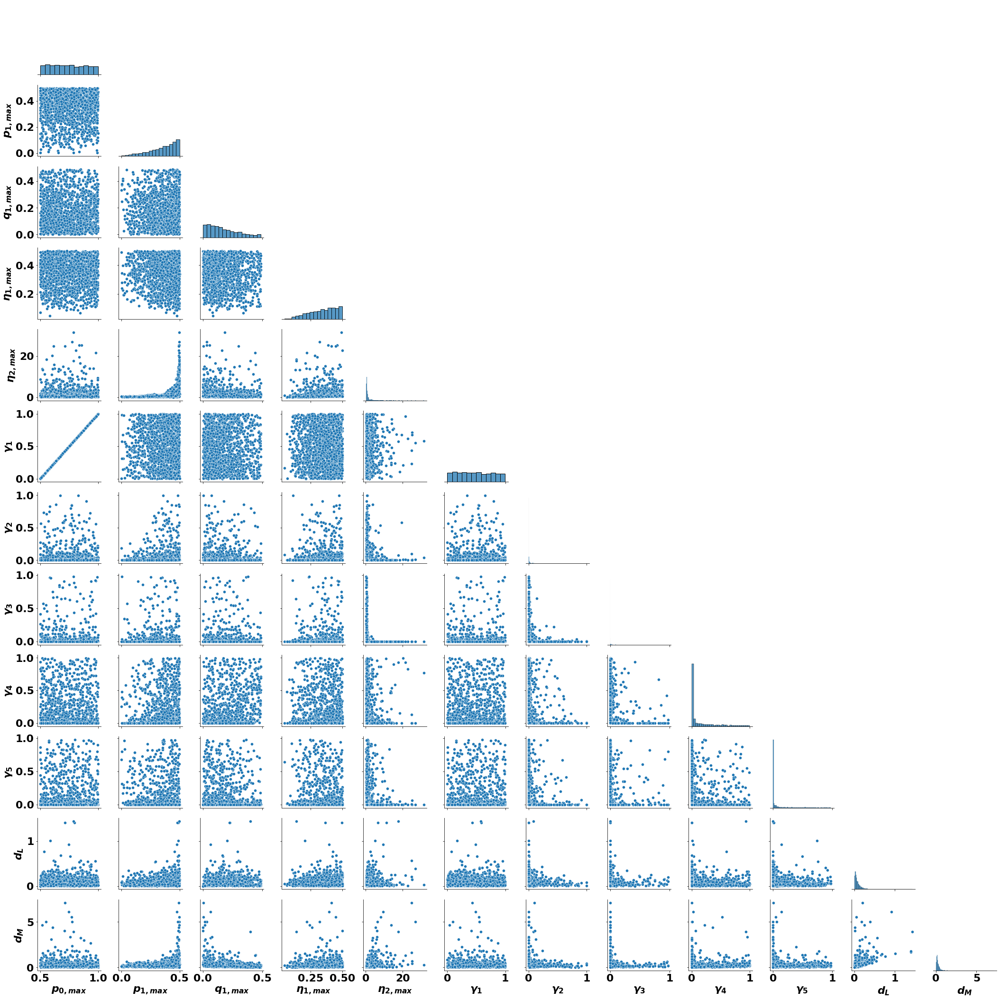

In [5]:
g = sns.pairplot(df_SS_Passague_parameters, corner = True, diag_kind = 'hist')
diag_kws={'bins':10}
g.savefig("Figures\parameter_distributions.pdf")

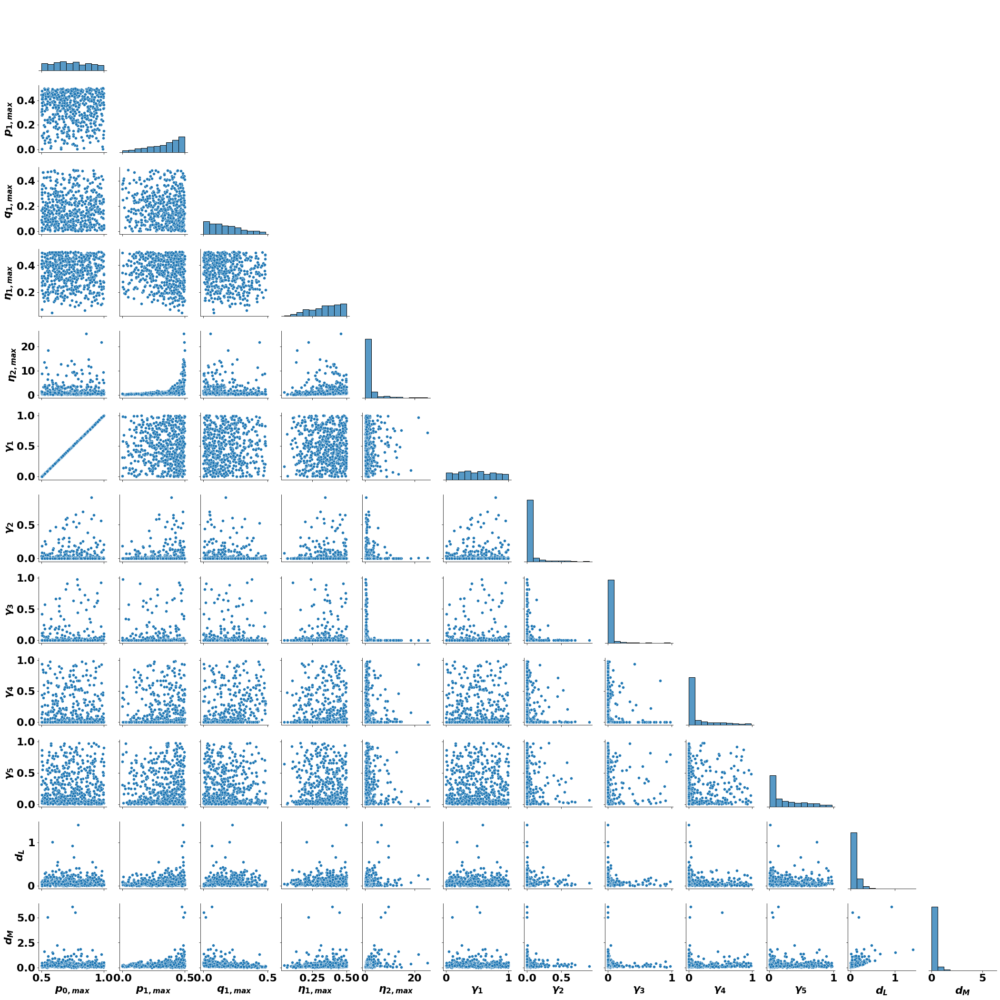

In [6]:
g = sns.PairGrid(df_temp.drop(['index'], axis=1), hue = None, palette=["C0", "C1", "k"], corner = True)
g.map_offdiag(sns.scatterplot)
g.map_diag(sns.histplot, hue=None, bins = 10)
g.savefig("Figures\parameter_distributions2.pdf")

## Gridsearch Robustness

First set of figs are perturbations from steady state

The second fig is used in paper. We start all populations out of steady state and vary gam1 and gam3 10%

In [7]:
data_t0_y0 = {'t':np.linspace(0,1000,1001), 'y0':[0.74513535, 1, 1, 1]}

parameter_set_of_interest = np.delete(df_temp.iloc[8].values.copy(), -1)
fcl_gridsearch = Four_cell_lineage()
param, y_SS = fcl_gridsearch.solve_ODE(fcl_gridsearch.Hematopoiesis_time_series, 
                     parameter_set_of_interest, 
                     data_t0_y0)

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


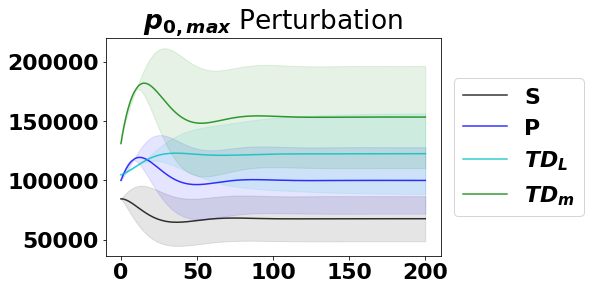

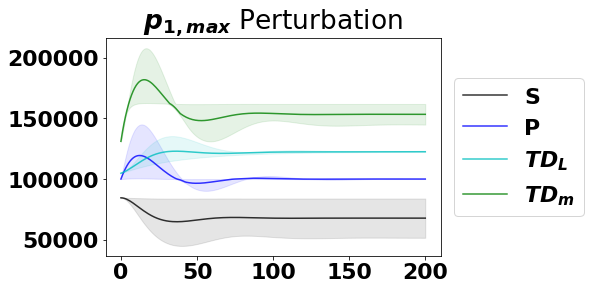

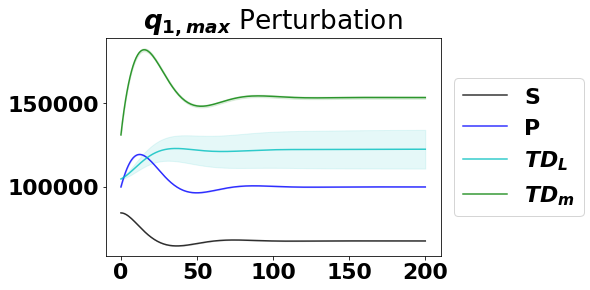

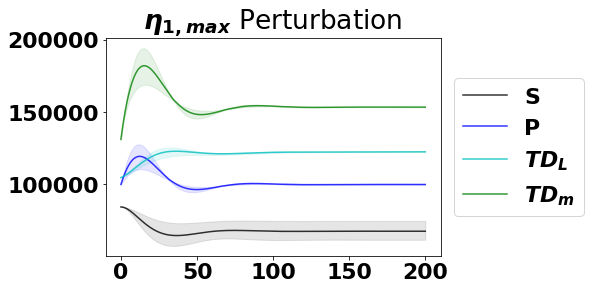

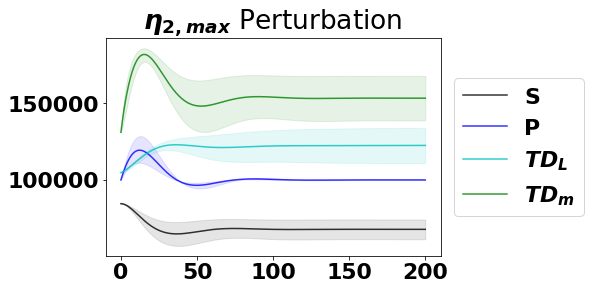

...

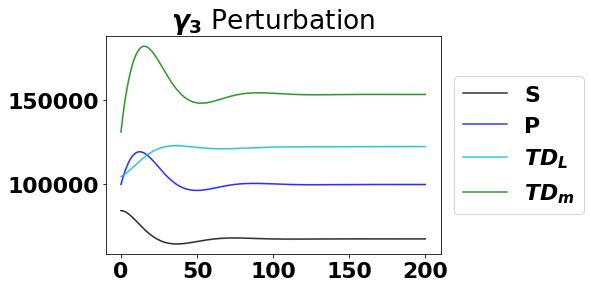

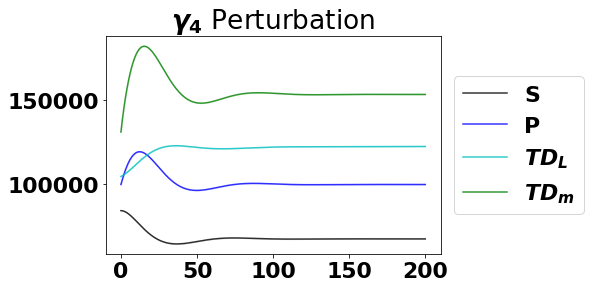

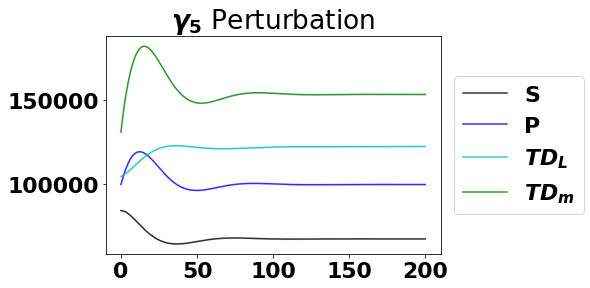

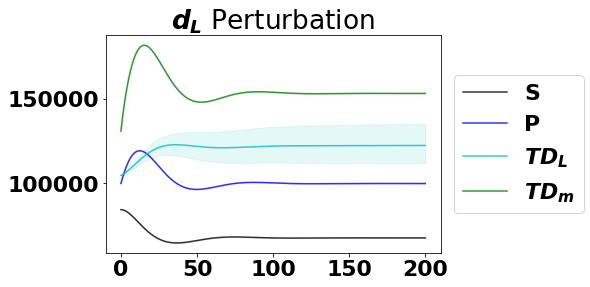

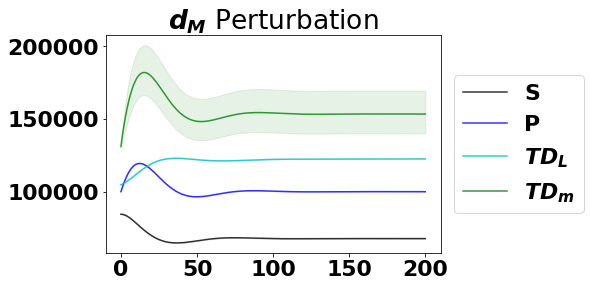

In [8]:
fcl_gridsearch = Four_cell_lineage()
pa = ['$p_{0,max}$','$p_{1,max}$','$q_{1,max}$',
      '$\eta_{1,max}$','$\eta_{2,max}$',
      '$\gamma_1$','$\gamma_2$','$\gamma_3$','$\gamma_4$','$\gamma_5$',
      '$d_L$','$d_M$']
data_t0_y0 = {'t':np.linspace(0,200,201), 'y0':[y_SS[-1,0]/y_SS[-1,1], 1, y_SS[-1,2]/y_SS[-1,1], y_SS[-1,3]/y_SS[-1,1]]}

for idx in range(12):
    y_sols=[]
    parameter_set = np.delete(df_temp.iloc[8].values.copy(), -1)
    parameter_set[6] = 0
    parameter_set[9] = 0
    for par in np.linspace(0.9* parameter_set[idx], 1.1*parameter_set[idx], 50):
        parameter_set_of_interest = parameter_set.copy()
        parameter_set_of_interest[idx] = par
        
        param, y = fcl_gridsearch.solve_ODE(fcl_gridsearch.Hematopoiesis_time_series, 
                             parameter_set_of_interest, 
                             data_t0_y0)
        y_sols.append(y)
    
    plt.figure()
    
    hsc_95 = np.percentile(np.r_[y_sols][:,:,0]*1e5, [2.5,50, 97.5],axis=0)
    mpp_95 = np.percentile(np.r_[y_sols][:,:,1]*1e5, [2.5,50,97.5],axis=0)
    tdl_95 = np.percentile(np.r_[y_sols][:,:,2]*1e5, [2.5,50,97.5],axis=0)
    tdm_95 = np.percentile(np.r_[y_sols][:,:,3]*1e5, [2.5,50,97.5],axis=0)
        
    plt.plot(data_t0_y0['t'],
                 hsc_95[1], 
                color='k', 
                alpha=0.8, label = 'S')
    plt.fill_between(data_t0_y0['t'], 
                     hsc_95[0], 
                     hsc_95[2], 
                     color='k',
                     alpha=0.1)
    
    plt.plot(data_t0_y0['t'],
                 mpp_95[1], 
                color='b', 
                alpha=0.8, label = 'P')
    
    plt.fill_between(data_t0_y0['t'], 
                     mpp_95[0], 
                     mpp_95[2], 
                     color='b',
                     alpha=0.1)
    
    plt.plot(data_t0_y0['t'],
                 tdl_95[1], 
                color='c', 
                alpha=0.8, label = '$TD_L$')
    plt.fill_between(data_t0_y0['t'], 
                 tdl_95[0], 
                 tdl_95[2], 
                 color='c',
                 alpha=0.1)
    plt.plot(data_t0_y0['t'],
                 tdm_95[1], 
                color='g', 
                alpha=0.8, label = '$TD_m$')
    plt.fill_between(data_t0_y0['t'], 
                 tdm_95[0], 
                 tdm_95[2], 
                 color='g',
                 alpha=0.1)
    lgd = plt.legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    plt.title(pa[idx] + ' Perturbation')
    plt.savefig('Figures\{}_10_percent_robustness.pdf'.format(pa[idx].replace('\\','')), bbox_extra_artists=(lgd,), bbox_inches='tight')


In [9]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 5}

matplotlib.rc('font', **font)

def design_space_dynamics_95(gam3,gam5,sfile):
    fcl_gridsearch = Four_cell_lineage()
    data_t0_y0 = {'t':np.linspace(0,2000,2001), 'y0':[0.1, 0.1, 0.1, 0.1]}
    plt.figure(figsize = (1.7,1.5), dpi = 300)

    for idx in [5,7]:
        y_sols=[]
        parameter_set = np.delete(df_temp.iloc[8].values.copy(), -1)
        parameter_set_c = parameter_set.copy()
        parameter_set_c[5] = gam3
        parameter_set_c[7] = gam5
        for par1 in np.linspace(0.9* parameter_set_c[5], 1.1*parameter_set_c[5], 50):
            for par2 in np.linspace(0.9* parameter_set_c[7], 1.1*parameter_set_c[7], 50):
                parameter_set_of_interest = parameter_set_c.copy()
                parameter_set_of_interest[5] = par1
                parameter_set_of_interest[7] = par2

                param, y = fcl_gridsearch.solve_ODE(fcl_gridsearch.Hematopoiesis_time_series, 
                                     parameter_set_of_interest, 
                                     data_t0_y0)
                y_sols.append(y)

        

        hsc_95 = np.percentile(np.r_[y_sols][:,:,0]*1e5, [2.5,50, 97.5],axis=0)
        mpp_95 = np.percentile(np.r_[y_sols][:,:,1]*1e5, [2.5,50,97.5],axis=0)
        tdl_95 = np.percentile(np.r_[y_sols][:,:,2]*1e5, [2.5,50,97.5],axis=0)
        tdm_95 = np.percentile(np.r_[y_sols][:,:,3]*1e5, [2.5,50,97.5],axis=0)

        
        plt.plot(data_t0_y0['t']/30,
                     hsc_95[1], 
                    color='k', 
                    alpha=0.8)
        plt.fill_between(data_t0_y0['t']/30, 
                         hsc_95[0], 
                         hsc_95[2], 
                         color='k',
                         alpha=0.1)

        plt.plot(data_t0_y0['t']/30,
                     mpp_95[1], 
                    color='b', 
                    alpha=0.8)

        plt.fill_between(data_t0_y0['t']/30, 
                         mpp_95[0], 
                         mpp_95[2], 
                         color='b',
                         alpha=0.1)

        plt.plot(data_t0_y0['t']/30,
                     tdl_95[1], 
                    color='c', 
                    alpha=0.8)
        plt.fill_between(data_t0_y0['t']/30, 
                     tdl_95[0], 
                     tdl_95[2], 
                     color='c',
                     alpha=0.1)
        plt.plot(data_t0_y0['t']/30,
                     tdm_95[1], 
                    color='g', 
                    alpha=0.8)
        plt.fill_between(data_t0_y0['t']/30, 
                     tdm_95[0], 
                     tdm_95[2], 
                     color='g',
                     alpha=0.1)

    plt.gca().yaxis.set_major_formatter(StrMethodFormatter('{x:.1e}'))
    xlab = plt.xlabel('Time (Months)',size = 7)
    ylab = plt.ylabel('Cell Count', size = 7)
    plt.tight_layout()
    plt.savefig('Figures/paramsetfolder/8/{}_10_percent_robustness.pdf'.format(sfile), bbox_extra_artists=(xlab,ylab,), bbox_inches='tight')


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


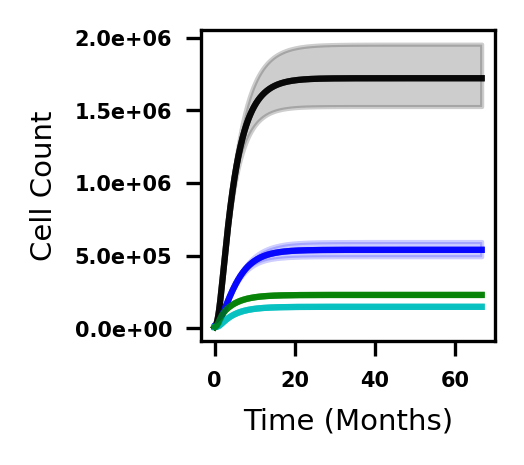

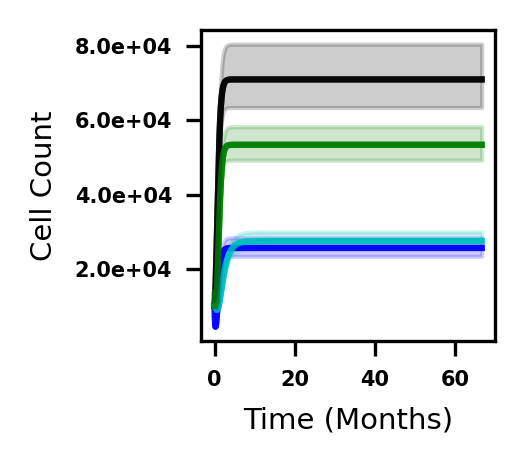

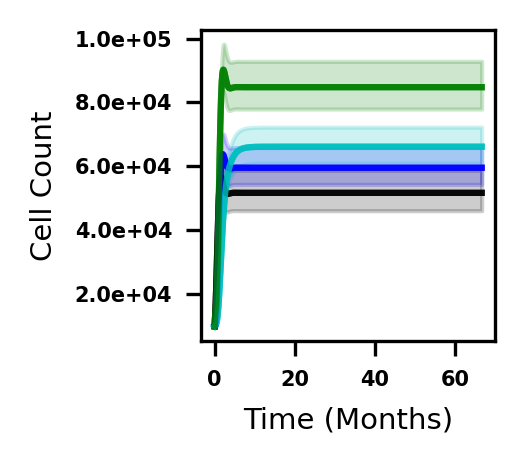

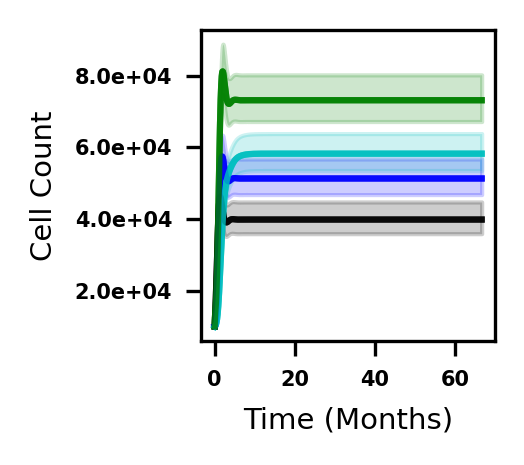

In [10]:
## REGION I
design_space_dynamics_95(9.5*1e-02,
                         .3,
                         'region_1')

## REGION II
design_space_dynamics_95(2,
                         30,
                         'region_2')

## REGION III
design_space_dynamics_95(df_temp.iloc[9].values[5],
                         df_temp.iloc[9].values[7],
                         'region_3')

## REGION IV
design_space_dynamics_95(1,
                         1e-2,
                         'region_4')

## SS Perturbation

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


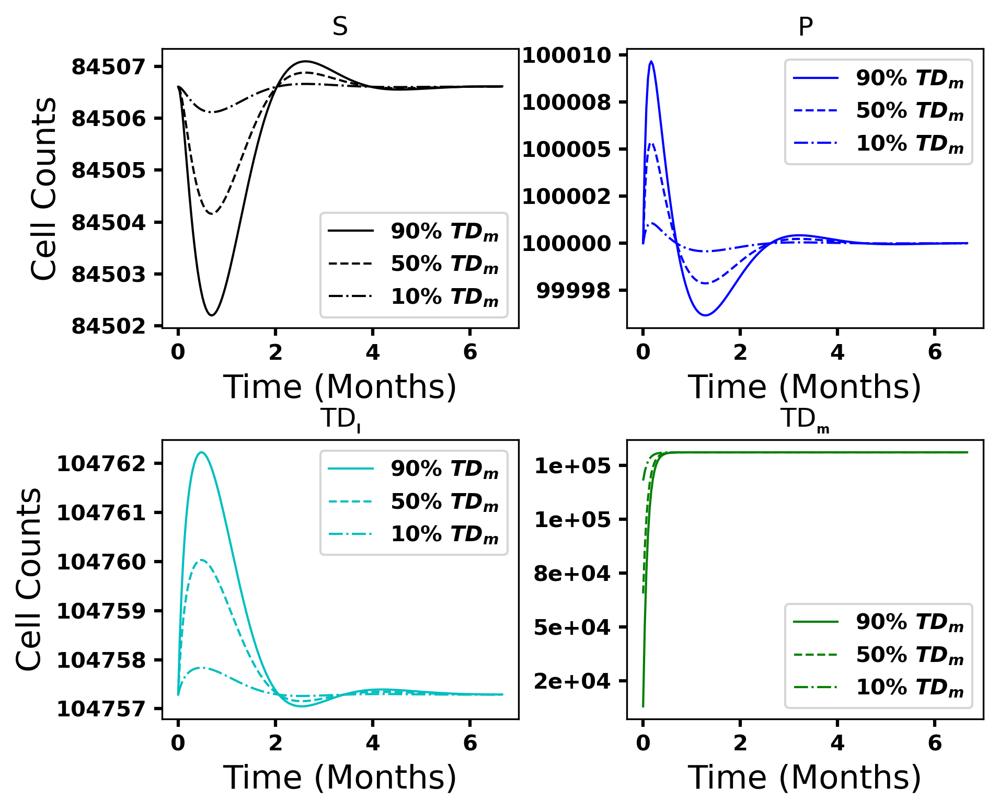

In [11]:
matplotlib.rcParams.update({'lines.linewidth' : 1})
matplotlib.rcParams.update({'xtick.labelsize': 10})
matplotlib.rcParams.update({'ytick.labelsize': 10})
matplotlib.rcParams.update({'legend.fontsize': 10})
matplotlib.rcParams.update({'font.size': 1})
matplotlib.rcParams.update({'xtick.major.width': 1.5})
matplotlib.rcParams.update({'ytick.major.width': 1.5})

## TD_M perturbation
fcl_gridsearch = Four_cell_lineage()


parameter_set = np.delete(df_temp.iloc[8].values.copy(), -1)
#parameter_set[6] = 0
#parameter_set[9] = 0
y_pert = []
pert = [0.1,0.5,0.9]
for fct in pert:
    data_t0_y0 = {'t':np.linspace(0,200,201), 'y0':[y_SS[-1,0]/y_SS[-1,1], 1, y_SS[-1,2]/y_SS[-1,1], fct*y_SS[-1,3]/y_SS[-1,1]]}
    param, y = fcl_gridsearch.solve_ODE(fcl_gridsearch.Hematopoiesis_time_series, 
                         parameter_set, 
                         data_t0_y0)
    y_pert.append(y)

    
f,axes = plt.subplots(nrows=2, ncols=2, figsize=(6.2,5), dpi = 300)
line_type = ['-', '--', '-.']
col_type = ['k', 'b','c','g']
count=0

for yp in y_pert:
    axes[0,0].plot(data_t0_y0['t']/30,yp[:,0]*1e5, line_type[count]+'k', label = '{}% $TD_m$'.format(round(100*pert[len(pert)-count-1])))
    axes[0,1].plot(data_t0_y0['t']/30,yp[:,1]*1e5, line_type[count]+'b', label = '{}% $TD_m$'.format(round(100*pert[len(pert)-count-1])))
    axes[1,0].plot(data_t0_y0['t']/30,yp[:,2]*1e5, line_type[count]+'c', label = '{}% $TD_m$'.format(round(100*pert[len(pert)-count-1])))
    axes[1,1].plot(data_t0_y0['t']/30,yp[:,3]*1e5, line_type[count]+'g', label = '{}% $TD_m$'.format(round(100*pert[len(pert)-count-1])))
    count+=1

axes[0,0].set_ylabel('Cell Counts', size = 15)
axes[1,0].set_ylabel('Cell Counts', size = 15)

axes[1,0].set_xlabel('Time (Months)', size = 15)
axes[1,1].set_xlabel('Time (Months)', size = 15)
axes[0,0].set_xlabel('Time (Months)', size = 15)
axes[0,1].set_xlabel('Time (Months)', size = 15)


axes[0,0].set_title('S', size = 12)
axes[0,1].set_title('P', size = 12)   
axes[1,0].set_title('TD$_{\\rm_l}$', size = 12)   
axes[1,1].set_title('TD$_{\\rm_m}$', size = 12)   

axes[0,0].yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
axes[0,1].yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
axes[1,0].yaxis.set_major_formatter(StrMethodFormatter('{x:.0f}'))
axes[1,1].yaxis.set_major_formatter(StrMethodFormatter('{x:.0e}'))

axes[0,0].legend()
axes[0,1].legend() 
axes[1,0].legend() 
axes[1,1].legend() 
f.tight_layout()
plt.savefig('Figures/paramsetfolder/8/TDM_pert.pdf')

## CML Dynamics

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


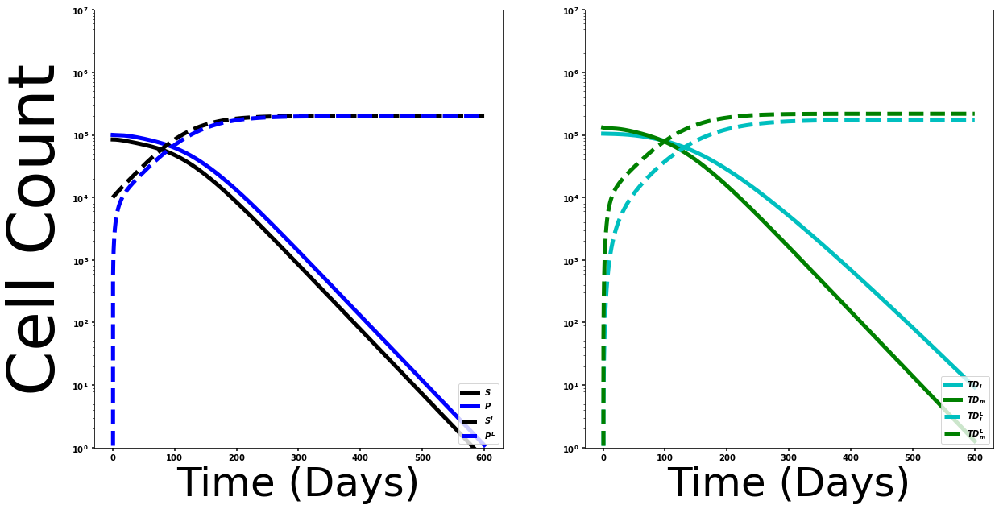

In [12]:
fcl_therapy = Four_cell_lineage();

parameter_set_CML = np.delete(df_temp.iloc[8].values.copy(),-1)

gam1_L = 0.5

normal = np.concatenate((parameter_set_CML,
                          [0,0,0,0,0,0,0,1,1,0,1]));
leukemia = np.concatenate((parameter_set_CML,
                          [gam1_L,1,1,1,1,0,0,1,1,0,1]));
therapy = leukemia


pars, time, y = fcl_therapy.Leukemia_evolution_TKI_ODE_dyanamics(normal, 
                                                                 leukemia, 
                                                                 therapy, 
                                                                 500, 
                                                                 100)

f,axes = plt.subplots(ncols=2, figsize=(20,10))
axes[0].semilogy(time,1e5*y[:,0], 'k', label='$S$', linewidth=5)
axes[0].semilogy(time,1e5*y[:,1], 'b', label='$P$', linewidth=5)
axes[1].semilogy(time,1e5*y[:,2], 'c', label='$TD_l$', linewidth=5)
axes[1].semilogy(time,1e5*y[:,3], 'g', label='$TD_m$', linewidth=5)
axes[0].set_xlabel('Time (Days)',size = 50)
axes[0].set_ylabel('Cell Count', size = 80)
axes[0].set_title('')
axes[0].set_ylim([1e-0,1e7])
axes[0].semilogy(time,1e5*y[:,4], '--k', label='$S^L$', linewidth=5)
axes[0].semilogy(time,1e5*y[:,5], '--b', label='$P^L$',linewidth=5)
axes[1].semilogy(time,1e5*y[:,6], '--c', label='$TD_l^L$',linewidth=5)
axes[1].semilogy(time,1e5*y[:,7], '--g', label='$TD_m^L$',linewidth=5)
axes[1].set_xlabel('Time (Days)', size = 50)
axes[1].set_ylim([1e-0,1e7])
axes[0].legend(loc = 4)
axes[1].legend(loc = 4)
f.savefig("Figures/no_therapy.pdf")

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


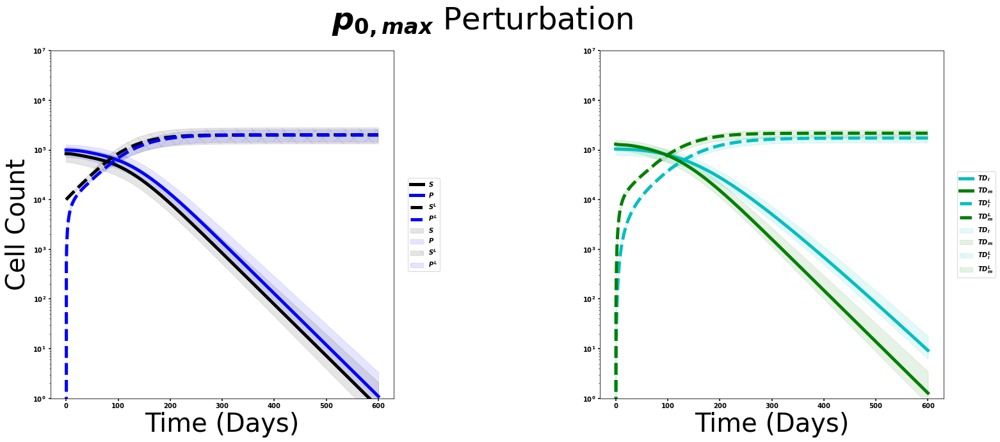

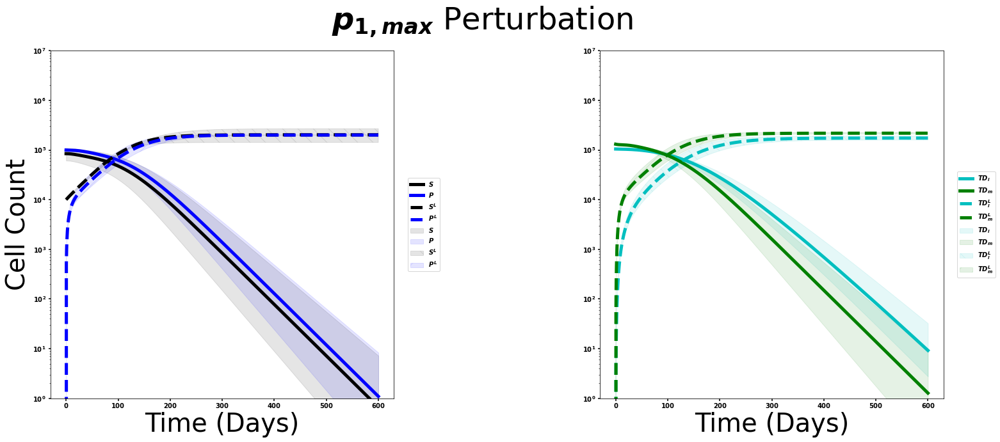

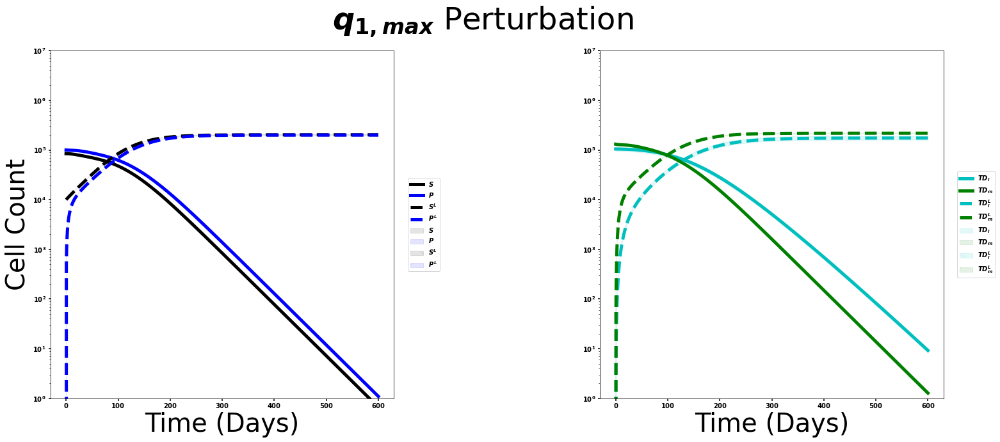

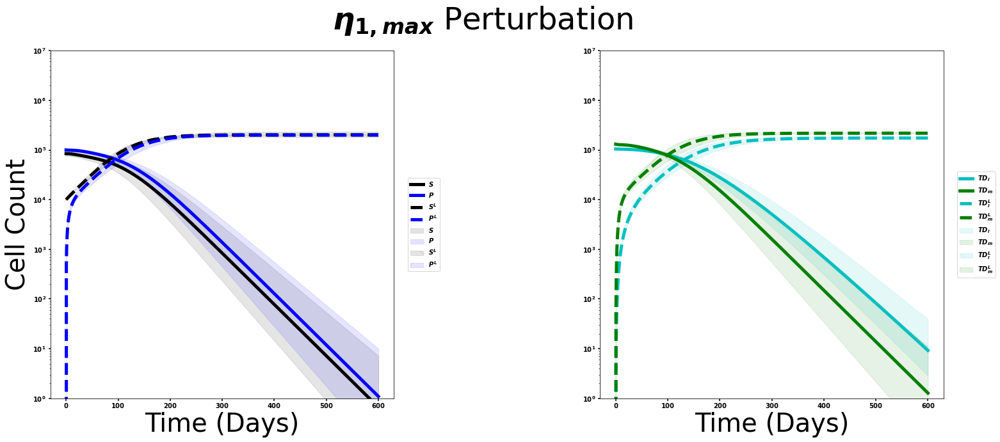

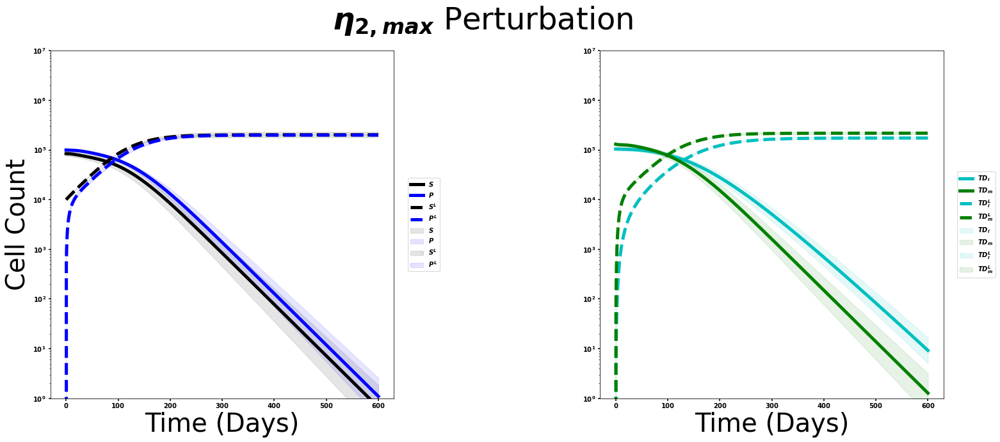

...

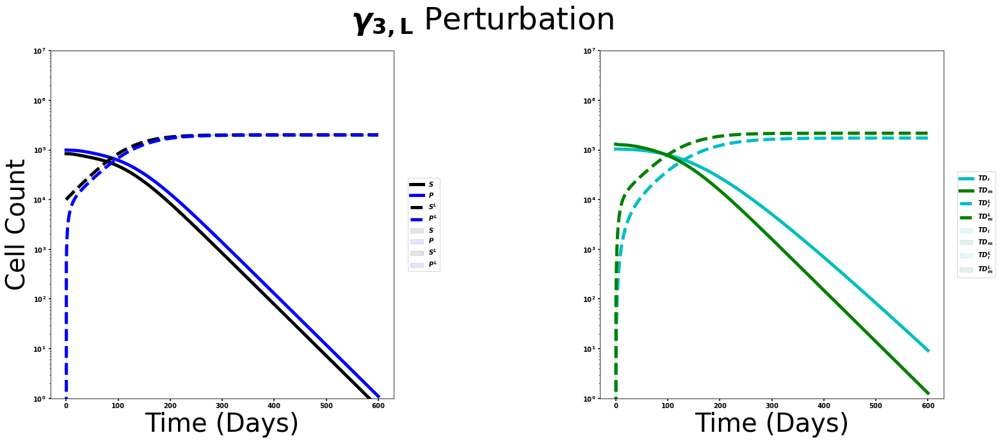

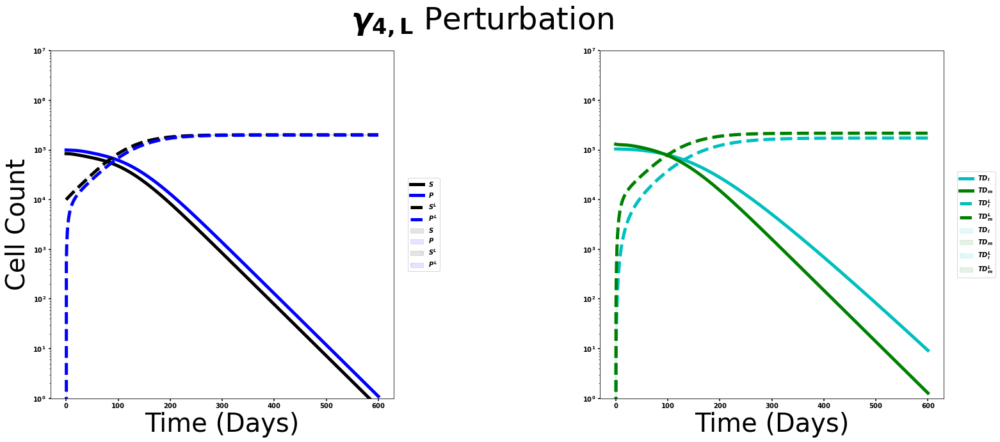

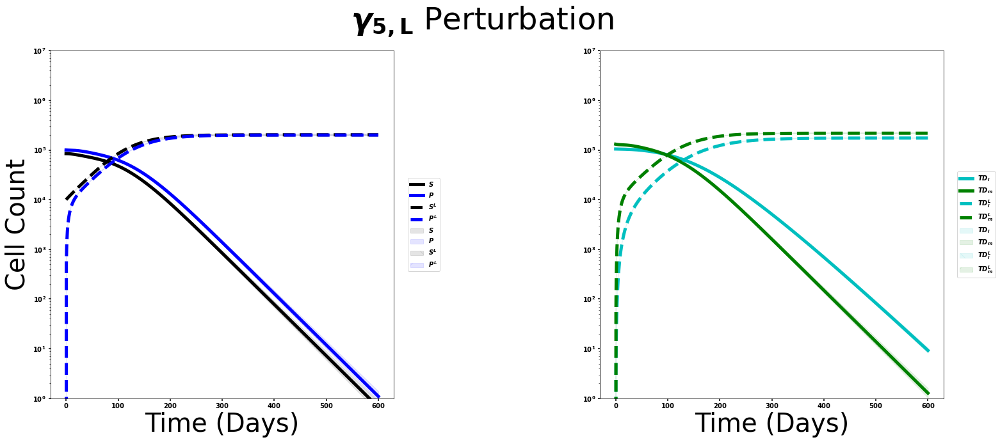

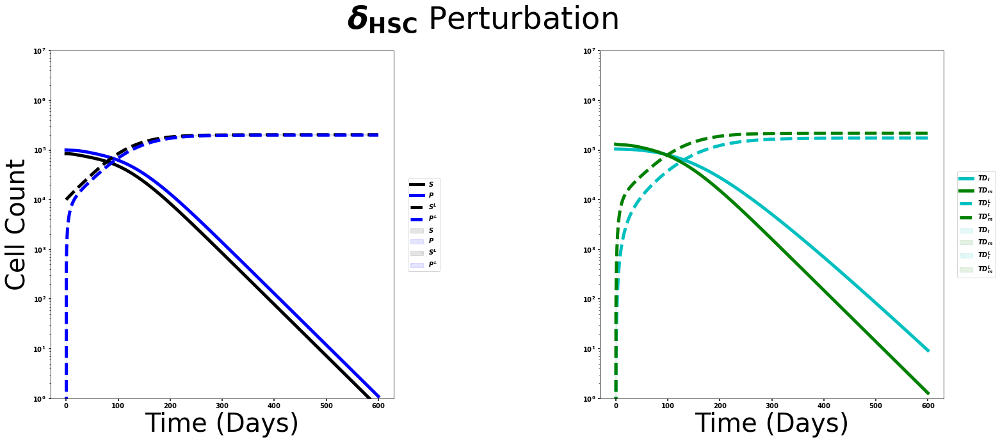

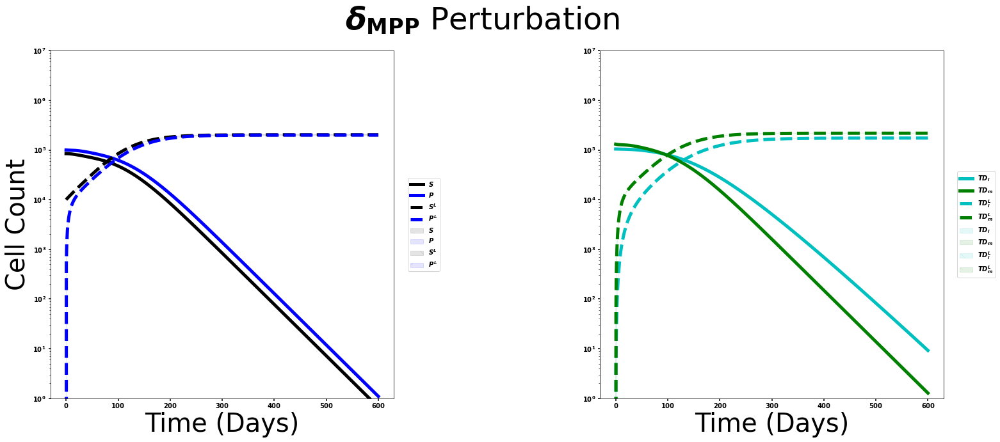

In [13]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 40}

matplotlib.rc('font', **font)

pa = ['$p_{0,max}$','$p_{1,max}$','$q_{1,max}$',
      '$\eta_{1,max}$','$\eta_{2,max}$',
      '$\gamma_1$','$\gamma_2$','$\gamma_3$','$\gamma_4$','$\gamma_5$',
      '$d_L$','$d_M$','$\gamma_{1\\rm, L}$','$\gamma_{2\\rm, L}$','$\gamma_{3\\rm, L}$','$\gamma_{4\\rm, L}$','$\gamma_{5\\rm, L}$','$\delta_{\\rm HSC}$','$\delta_{\\rm MPP}$']
fcl_therapy = Four_cell_lineage();
# gam1_L (L-HSC gain % dec.)
parameter_set_CML = np.delete(df_temp.iloc[8].values.copy(),-1)
gam1_L = 0.5

normal = np.concatenate((parameter_set_CML,
                          [0,0,0,0,0,0,0,1,1,0,1]));
leukemia = np.concatenate((parameter_set_CML,
                          [gam1_L,1,1,1,1,0,0,1,1,0,1]));
therapy = leukemia

for idx in range(len(normal)-4):
    y_sols=[]
    
    for par in np.linspace(0.9, 1.1, 100):
        parameter_set_of_interest = normal.copy()
        parameter_set_of_interest[idx] = par*normal[idx]
        leukemia_of_interest = leukemia.copy()
        leukemia_of_interest[idx] = par*leukemia[idx]
        therapy_of_interest = leukemia_of_interest 
        
        pars, time, y = fcl_therapy.Leukemia_evolution_TKI_ODE_dyanamics(parameter_set_of_interest, 
                                                                 leukemia_of_interest, 
                                                                 therapy_of_interest, 
                                                                 500, 
                                                                 100)
        y_sols.append(y)
    
    hsc_95 = np.percentile(np.r_[y_sols][:,:,0]*1e5, [2.5,50, 97.5],axis=0)
    mpp_95 = np.percentile(np.r_[y_sols][:,:,1]*1e5, [2.5,50,97.5],axis=0)
    tdl_95 = np.percentile(np.r_[y_sols][:,:,2]*1e5, [2.5,50,97.5],axis=0)
    tdm_95 = np.percentile(np.r_[y_sols][:,:,3]*1e5, [2.5,50,97.5],axis=0)
    hsc_95_L = np.percentile(np.r_[y_sols][:,:,4]*1e5, [2.5,50, 97.5],axis=0)
    mpp_95_L = np.percentile(np.r_[y_sols][:,:,5]*1e5, [2.5,50,97.5],axis=0)
    tdl_95_L = np.percentile(np.r_[y_sols][:,:,6]*1e5, [2.5,50,97.5],axis=0)
    tdm_95_L = np.percentile(np.r_[y_sols][:,:,7]*1e5, [2.5,50,97.5],axis=0)


    f,axes = plt.subplots(ncols=2, figsize=(25,10))
    f.subplots_adjust(wspace=.6)
    axes[0].semilogy(time,hsc_95[1], 'k', label='$S$', linewidth=5)
    axes[0].fill_between(time, 
                         hsc_95[0], 
                         hsc_95[2], 
                         color='k',
                         alpha=0.1, label='$S$')
    axes[0].semilogy(time,mpp_95[1], 'b', label='$P$', linewidth=5)
    axes[0].fill_between(time, 
                         mpp_95[0], 
                         mpp_95[2], 
                         color='b',
                         alpha=0.1, label='$P$')
    axes[1].semilogy(time,tdl_95[1], 'c', label='$TD_l$', linewidth=5)
    axes[1].fill_between(time, 
                         tdl_95[0], 
                         tdl_95[2], 
                         color='c',
                         alpha=0.1, label='$TD_l$')
    axes[1].semilogy(time,tdm_95[1], 'g', label='$TD_m$', linewidth=5)
    axes[1].fill_between(time, 
                         tdm_95[0], 
                         tdm_95[2], 
                         color='g',
                         alpha=0.1, label='$TD_m$')
    axes[0].set_xlabel('Time (Days)')
    axes[0].set_ylabel('Cell Count')
    axes[0].set_title('')
    axes[0].set_ylim([1e-0,1e7])
    axes[0].semilogy(time,hsc_95_L[1], '--k', label='$S^L$', linewidth=5)
    axes[0].fill_between(time, 
                         hsc_95_L[0], 
                         hsc_95_L[2], 
                         color='k',
                         hatch = '\\',
                         alpha=0.1, label='$S^L$')
    axes[0].semilogy(time,mpp_95_L[1], '--b', label='$P^L$',linewidth=5)
    axes[0].fill_between(time, 
                         mpp_95_L[0], 
                         mpp_95_L[2], 
                         color='b',
                         hatch = '/',
                         alpha=0.1, label='$P^L$')
    axes[1].semilogy(time,tdl_95_L[1], '--c', label='$TD_l^L$',linewidth=5)
    axes[1].fill_between(time, 
                         tdl_95_L[0], 
                         tdl_95_L[2], 
                         color='c',
                         hatch = '\\',
                         alpha=0.1, label='$TD_l^L$')
    axes[1].semilogy(time,tdm_95_L[1], '--g', label='$TD_m^L$',linewidth=5)
    axes[1].fill_between(time, 
                         tdm_95_L[0], 
                         tdm_95_L[2], 
                         color='g',
                         hatch = '/',
                         alpha=0.1, label='$TD_m^L$')
    axes[1].set_xlabel('Time (Days)')
    axes[1].set_ylim([1e-0,1e7])
    stitle = f.suptitle(pa[idx] + ' Perturbation')
    axes[0].legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    lgd = axes[1].legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
    f.savefig('Figures\{}_10_percent_robustness_CML.pdf'.format(pa[idx].replace('\\','').replace('rm','').replace(' ','')), bbox_extra_artists=(lgd,stitle), bbox_inches='tight')



## Transplant Experiment

Summary:

Using a doxycycline inducible CML mouse, Reynaud et al showed how drastically the dynamics can change when different cell types are transplanted into a CML mouse. The dynamics we are focusing on are on transplanting HSCs or MPPs. If 4000 leukemic HSCs are transplanted into a CML mouse, the ratio of transplanted terminal myeloid/lymphoid is 75/25. Interestingly, if 4000 MPPs are transplanted into a CML mouse, the transplanted terminal myeloid/lymphoid is 85/15. 

We are able to suggest a potential mechanism with our model. The model suggests the shift in the Lymphoid/Myeloid ratio is due to the ability for HSCs to be self sustaining and the fast death rate of Myeloid cells.

Setup:
We allow the system go to steady state. Once the system is at steady state, we simulate radiation by killing 75% of all cell types.  We introduce a parallel lineage and add 4000 cells to either the HSC compartment or MPP Compartment. The parallel lineage has the same feedbacks with the same parameters. The feedbacks for both lineages are now shared. Thus, the new feedbacks have the form $\bar{p}/(1+\gamma(x_i^h + x_i^{d}))$, where $x_i^h$ is the $i^{th}$ host population providing the feedback and $x_i^d$ is the $i^{th}$ donor population providing the feedback 

<img src="Figures/Reynaud_transplant_experiment.png">
Reynaud et al.

In [14]:
from multiprocess import Pool
from tqdm.notebook import tqdm
from functools import partial

def turbo_transplant(paramset):
    
    from four_cell_lineage_class import Four_cell_lineage
    import numpy as np

    def Transplant_dynamics(yss, pars, rad_trans1_trans_2):
        import numpy as np
        fcl_transplant = Four_cell_lineage();
        t_y0_trans = dict(y0=np.concatenate((np.multiply(yss[-1],rad_trans1_trans_2[0]),[rad_trans1_trans_2[1],rad_trans1_trans_2[2],0,0])),
                                              t=np.linspace(0,35,100))
        _, y = fcl_transplant.solve_ODE(fcl_transplant.Hematopoiesis_transplant_experiment, pars, t_y0_trans)
        return t_y0_trans['t'], y
    
    fcl = Four_cell_lineage()
    t_y0 = dict(y0=[0.1,1,1,1], t=np.linspace(0,100000,10000))
    transplant_HSC = 4000/1e5
    transplant_MPP = 4000/1e5
    parameter_set = paramset
    results = np.zeros((2,21,21))
    
    _, y_ss = fcl.solve_ODE(fcl.Hematopoiesis_time_series, parameter_set, t_y0)
    
    for i in range(21):
        for j in range(21):
            rad_percent = [1-(.5+i/100),1-(.3+j/100),.9,.9]
            # HSC transplant experiment
            _, y_hsc = Transplant_dynamics(y_ss, parameter_set, [rad_percent, transplant_HSC, 0])
            # MPP transplant experiment
            t, y_mpp = Transplant_dynamics(y_ss, parameter_set, [rad_percent, 0, transplant_MPP])

            results[0,i,j] = y_hsc[-1,7]/(y_hsc[-1,6]+y_hsc[-1,7])
            results[1,i,j] = y_mpp[-1,7]/(y_mpp[-1,6]+y_mpp[-1,7])
    return results

with Pool(processes=20) as p:
    summary = list(tqdm(p.imap(turbo_transplant, [df_temp.iloc[i,:-1].copy() for i in range(df_temp.shape[0])]),total=df_temp.shape[0]))
summary = np.array(summary)


  0%|          | 0/563 [00:00<?, ?it/s]

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


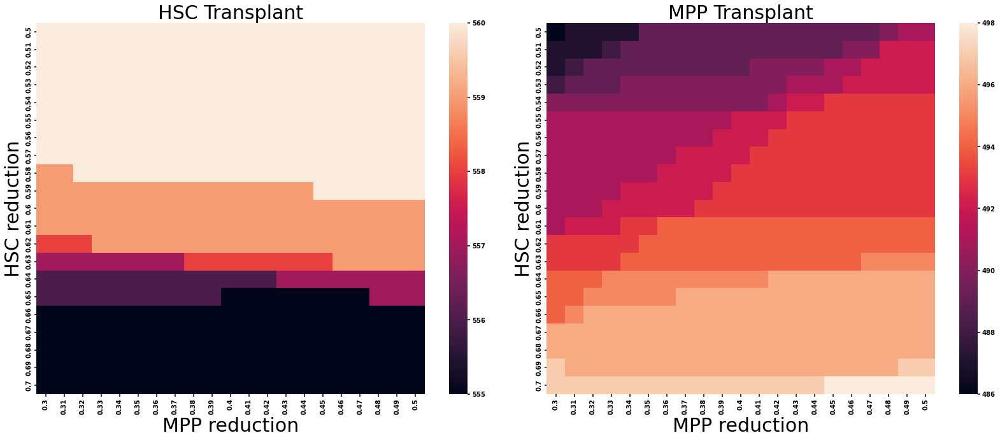

In [15]:
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 20}

matplotlib.rc('font', **font)
matplotlib.rcParams.update({'axes.titlesize': 30})
matplotlib.rcParams.update({'axes.labelsize': 30})

summary2 = np.swapaxes(summary.copy(), 0, 1)
summary2[0] = 1*(summary2[0] >.5)
summary2[1] = 1*(summary2[1] <.5)
successrate = np.sum(summary2, axis = 1)

f,axes = plt.subplots(ncols=2, figsize=(23,10))
f.sca(axes[0])
sns.heatmap(successrate[0], yticklabels = ['{:.2}'.format((.5+i/100)) for i in range(21)], xticklabels = ['{:.2}'.format((.3+i/100)) for i in range(21)])
f.sca(axes[1])
sns.heatmap(successrate[1], yticklabels = ['{:.2}'.format((.5+i/100)) for i in range(21)], xticklabels = ['{:.2}'.format((.3+i/100)) for i in range(21)])

axes[0].set(title = 'HSC Transplant', xlabel = 'MPP reduction', ylabel = 'HSC reduction')
axes[1].set(title = 'MPP Transplant', xlabel = 'MPP reduction', ylabel = 'HSC reduction')
f.tight_layout()
f.savefig('Figures/Supplemental/transplantdepletionsweep.pdf')

In [16]:
summary2 = np.swapaxes(summary.copy(), 0, 1)
failtype1 = np.unique(np.where(summary2[0] < .5)[0])
failtype2 = np.unique(np.where(summary2[1] > .5)[0])
faildex1 = np.array([np.where(summary2[0][i] == np.min(summary2[0][i], axis = (0,1))) for i in failtype1])
faildex2 = np.array([np.where(summary2[1][i] == np.max(summary2[1][i], axis = (0,1))) for i in failtype2])
faildex1 = np.reshape(faildex1, faildex1.shape[:2])
faildex2 = np.reshape(faildex2, faildex2.shape[:2])

C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:16: Runtime

C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true_divide
C:\Users\olatn\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in true

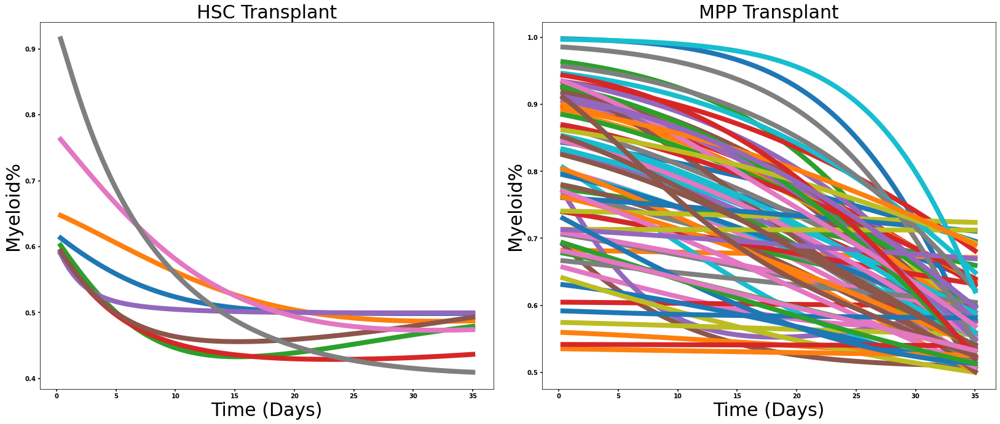

In [17]:
import warnings
warnings.filterwarnings(action='once')

f,axes = plt.subplots(ncols=2, figsize=(23,10))
fcl_transplant = Four_cell_lineage()
t_y0 = dict(y0=[0.1,1,1,1], t=np.linspace(0,100000,10000))
for i in range(faildex1.shape[0]):
    parameter_set = df_temp.iloc[failtype1[i],:-1].copy()
    rad_percent = [1-(.5+faildex1[i][0]/100),1-(.3+faildex1[i][1]/100),.9,.9]
    transplant_HSC = 4000/1e5
    transplant_MPP = 4000/1e5
    # HSC transplant experiment
    t, y_hsc = fcl_transplant.Transplant_dynamics(parameter_set, 
                                                  [rad_percent, transplant_HSC, 0])
    
    axes[0].plot(t,y_hsc[:,7]/(y_hsc[:,6]+y_hsc[:,7]),linewidth=8, label='HSC transplant');
    
for i in range(faildex2.shape[0]):
    parameter_set = df_temp.iloc[failtype2[i],:-1].copy()
    rad_percent = [1-(.5+faildex2[i][0]/100),1-(.3+faildex2[i][1]/100),.9,.9]
    
   # MPP transplant experiment
    t, y_mpp = fcl_transplant.Transplant_dynamics(parameter_set,
                                                  [rad_percent, 0, transplant_MPP])
    
    axes[1].plot(t,y_mpp[:,7]/(y_mpp[:,6]+y_mpp[:,7]),linewidth=8, label='MPP transplant'); 
    
    
#axes[1].set_ylim(axes[0].get_ylim())
axes[0].set(title = 'HSC Transplant', xlabel = 'Time (Days)', ylabel = 'Myeloid%')
axes[1].set(title = 'MPP Transplant', xlabel = 'Time (Days)', ylabel = 'Myeloid%')
f.tight_layout()
f.savefig('Figures/Supplemental/transplantdepletionsweepworstcases.pdf')

In [18]:
fcl_transplant = Four_cell_lineage()
t_y0 = dict(y0=[0.1,1,1,1], t=np.linspace(0,100000,10000))
parameter_set = df_temp.iloc[8,:-1].copy()
rad_percent = [.45,.65,.9,.9]
transplant_HSC = 4000/1e5
transplant_MPP = 4000/1e5
# HSC transplant experiment
_, y_hsc = fcl_transplant.Transplant_dynamics(parameter_set, 
                                              [rad_percent, transplant_HSC, 0])
# MPP transplant experiment
t, y_mpp = fcl_transplant.Transplant_dynamics(parameter_set,
                                              [rad_percent, 0, transplant_MPP])

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


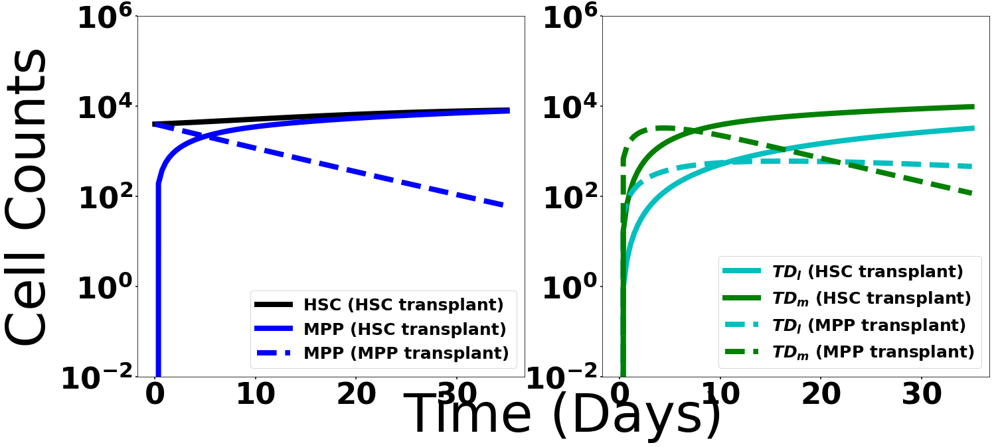

In [19]:
# Plot Transplanted cell counts
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 40}

matplotlib.rc('font', **font)


f,axes = plt.subplots(ncols=2, figsize=(23,10))
axes[0].semilogy(t,y_hsc[:,4]*1e5, 'k',linewidth=8, label='HSC (HSC transplant)');
axes[0].semilogy(t,y_hsc[:,5]*1e5,'b',linewidth=8, label='MPP (HSC transplant)');

axes[1].semilogy(t,y_hsc[:,6]*1e5, 'c',linewidth=8, label='$TD_l$ (HSC transplant)');
axes[1].semilogy(t,y_hsc[:,7]*1e5,'g',linewidth=8, label='$TD_m$ (HSC transplant)');

axes[0].semilogy(t,y_mpp[:,5]*1e5,'--b',linewidth=8, label='MPP (MPP transplant)');
axes[1].semilogy(t,y_mpp[:,6]*1e5, '--c',linewidth=8, label='$TD_l$ (MPP transplant)');
axes[1].semilogy(t,y_mpp[:,7]*1e5,'--g',linewidth=8, label='$TD_m$ (MPP transplant)');
axes[0].set_ylim([1e-2,1e6])
axes[1].set_ylim([1e-2,1e6])
axes[0].set_ylabel('Cell Counts', size = 80)
axes[0].set_title('')
axes[1].set_title('')
axes[0].legend(loc = 4, prop={'size': 25})
axes[1].legend(loc = 4, prop={'size': 25})
axes[0].tick_params(axis='x', labelsize = 45)
axes[0].tick_params(axis='y', labelsize = 45)
axes[1].tick_params(axis='x', labelsize = 45)
axes[1].tick_params(axis='y', labelsize = 45)
f.add_subplot(111, frameon=False)
# hide tick and tick label of the big axes
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.grid(False)
lab = plt.xlabel('Time (Days)', size = 80)

plt.savefig('Figures/Passague-exp.pdf', bbox_extra_artists=(lab,), bbox_inches='tight')

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


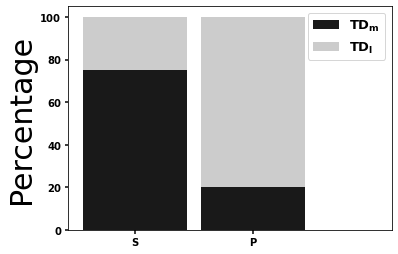

In [20]:
# Plot Transplanted cell counts
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}

matplotlib.rc('font', **font)
myeloid_model = [(100*y_hsc[-1,7]*10**5)/(y_hsc[-1,6]*10**5+y_hsc[-1,7]*10**5),
           (100*y_mpp[-1,7]*10**5)/(y_mpp[-1,6]*10**5+y_mpp[-1,7]*10**5)]
lymphoid_model = [(100*y_hsc[-1,6]*10**5)/(y_hsc[-1,6]*10**5+y_hsc[-1,7]*10**5),
                  (100*y_mpp[-1,6]*10**5)/(y_mpp[-1,6]*10**5+y_mpp[-1,7]*10**5)]

lymphoid = [90.71-70.19, 88.46-2.24]
myeloid = [70.19, 2.24]

#plt.bar(height=myeloid,x=[1.05,3.05],color='black', alpha=.9)
#plt.bar(height=lymphoid,x=[1.05,3.05],bottom=myeloid,color='black',alpha=0.2)
plt.bar(height=myeloid_model,x=[1.05,1.95],color='black',alpha=0.9)
plt.bar(height=lymphoid_model,x=[1.05,1.95], bottom=myeloid_model,color='black',alpha=0.2)
plt.bar(height=0,x=[2.5])
plt.xticks([1.05,1.95],['S', 'P'], )
plt.legend(['$\\rm TD_m$','$\\rm TD_l$'], loc = 'best', prop={'size': 13})
plt.ylabel('Percentage', size = 30)
plt.tight_layout()
plt.savefig('Figures/Transplant_exp_passague_bar.pdf')

In [21]:
allfails = np.unique(np.concatenate((failtype1,failtype2)))
nofails = [i for i in range(df_temp.shape[0]) if i not in allfails]
df_nofails = df_temp.iloc[nofails,:-1]

## Therapy

### TKI Therapy

In [22]:
def plotting_populations_CML(therapy_start, therapy_end, eta1decrease, etatherapy1, etatherapy2, filename, paramset, plotit, tstrength):
    fcl_therapy = Four_cell_lineage();
    # gam1_L (L-HSC gain % dec.)
    gam1_L = .5
    gam5_L = 1
    
    #parameter set for normal hematopoiesis
    parameter_set_CML = df_nofails.iloc[paramset,:].copy()
    
    # HSC sensitivity to therapy
    delta_hsc, delta_mpp = tstrength


    normal = np.concatenate((parameter_set_CML.values,
                              [0,0,0,0,0,0,0,1,1,0,1]));
    leukemia = np.concatenate((parameter_set_CML.values,
                              [gam1_L,1,1,1,gam5_L,0,0,1,1,0,1]));
    therapy = np.concatenate((parameter_set_CML.values,
                              [gam1_L,1,1,1,gam5_L,delta_hsc,delta_mpp,eta1decrease,1,etatherapy1,etatherapy2]));
        

    pars, time, y = fcl_therapy.Leukemia_evolution_TKI_ODE_dyanamics(normal, 
                                                                     leukemia, 
                                                                     therapy, 
                                                                     therapy_start, 
                                                                     therapy_end)
    
    pars = [normal, leukemia, therapy]
    
    if plotit:
        f,axes = plt.subplots(nrows=2, figsize=(11,21))
        axes[0].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,0], 'k', label='$S$')
        axes[0].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,1], 'b', label='$P$')
        axes[1].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,2], 'c', label='$TD_l$')
        axes[1].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,3], 'g', label='$TD_m$')
        axes[0].set_title('')
        axes[0].set_ylim([1e0,1e7])
        axes[0].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,4], '--k', label='$S^L$')
        axes[0].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,5], '--b', label='$P^L$')
        axes[1].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,6], '--c', label='$TD_l^L$')
        axes[1].semilogy((time[999:]-therapy_start)/30,1e5*y[999:,7], '--g', label='$TD_m^L$')
        axes[1].set_xlabel('Time After Therapy (Months)')
        axes[1].set_title('')
        axes[1].set_ylim([1e0,1e7])
        axes[0].legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
        lgd = axes[1].legend(bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
        axes[0].set_ylabel('Cell Counts')
        axes[1].set_ylabel('Cell Counts')
        f.savefig("Figures/{}_{}.pdf".format(filename,paramset), bbox_extra_artists=(lgd,), bbox_inches='tight')
    
    return pars, time, y

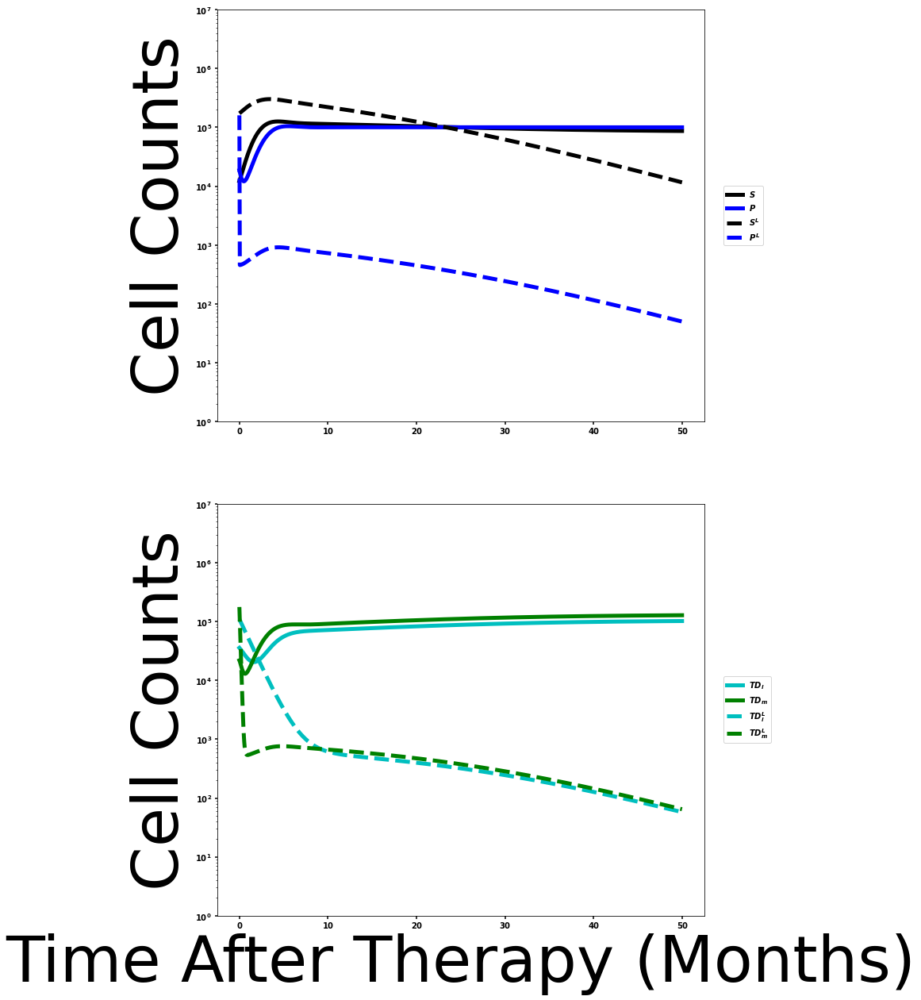

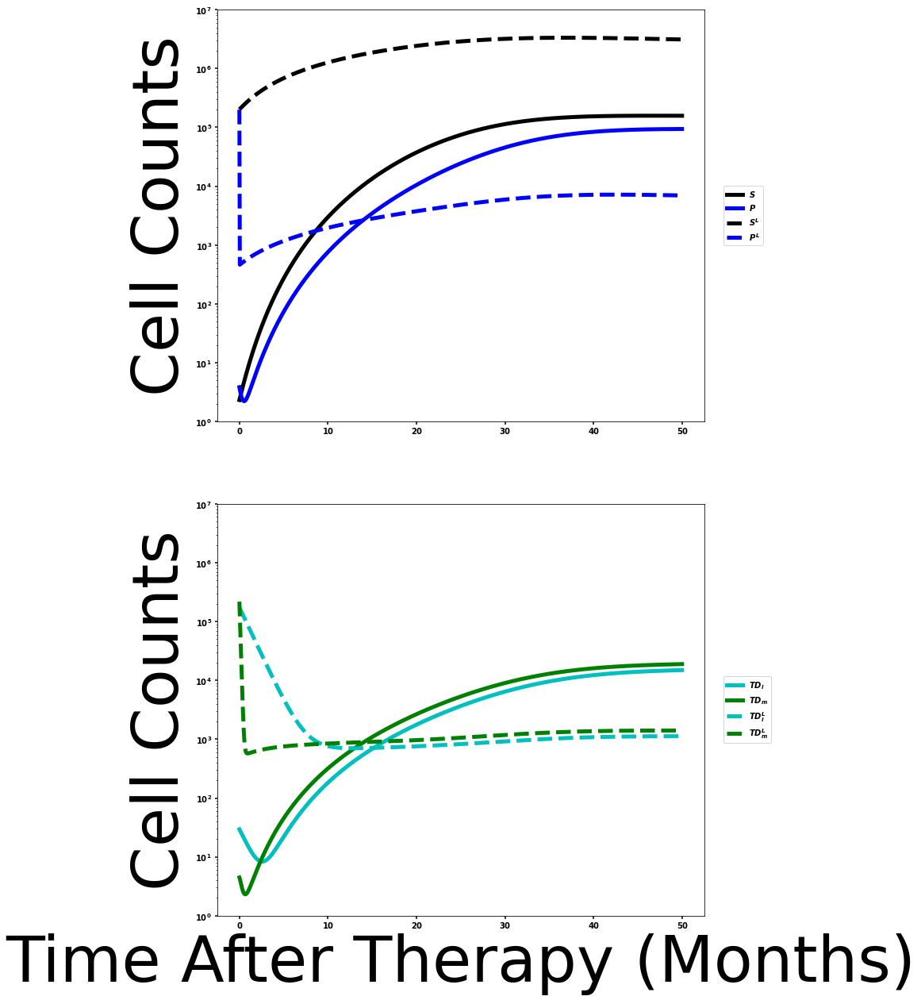

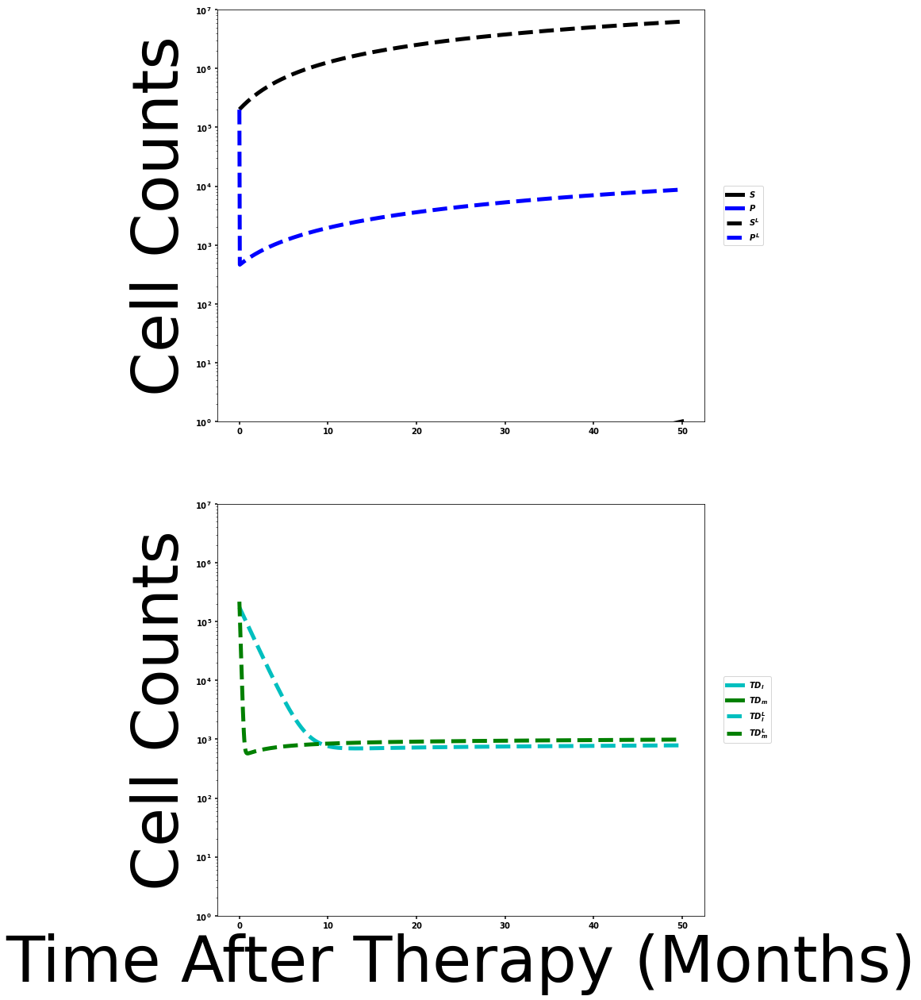

In [23]:
matplotlib.rcParams.update({'axes.labelsize' : 80})
matplotlib.rcParams.update({'axes.titlesize' : 8})
matplotlib.rcParams.update({'lines.linewidth' : 5})

matplotlib.rcParams.update({'font.size': 50})
matplotlib.rcParams.update({'lines.markersize' : 5})

p_e2,t_e2,y_e2 = plotting_populations_CML(therapy_start=365*.5, therapy_end=1500, eta1decrease = 0.5, etatherapy1 = 0, etatherapy2 = 1, filename='therapy_early', paramset = 7, plotit = True, tstrength = [.25,30])

## Mid therapy

#allow leukemic populations to grow for 1.5 years
p_m2,t_m2,y_m2 = plotting_populations_CML(therapy_start=365*1.5, therapy_end=1500, eta1decrease = 0.5, etatherapy1 = 0, etatherapy2 = 1, filename='therapy_mid', paramset = 7, plotit = True, tstrength = [.25,30])

## Late treatment

#allow leukemic populations to grow for 3 years
p_l2,t_l2,y_l2 = plotting_populations_CML(therapy_start=365*3, therapy_end=1500, eta1decrease = 0.5, etatherapy1 = 0, etatherapy2 = 1, filename='therapy_late', paramset = 7, plotit = True, tstrength = [.25,30])


0.9341809972784365


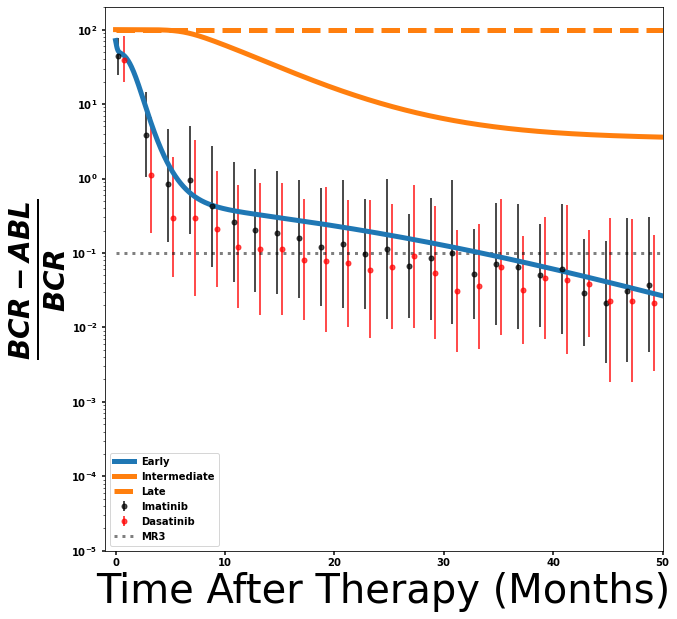

In [24]:
df_Roeder_points = pd.read_csv('Grid-search/wpd_datasets.csv').dropna().astype(float)

Roeder_points = df_Roeder_points.T.to_numpy()

matplotlib.rcParams.update({'font.size': 25})
matplotlib.rcParams.update({'lines.markersize' : 5})
matplotlib.rcParams.update({'lines.linewidth' : 2})

print(y_e2[999,4]/(y_e2[999,0]+y_e2[999,4]))

plt.figure(figsize=(10,10))
plt.ylim([1e-5, 2e2])
plt.xlim([-1,50])
plt.semilogy((t_e2[999:]-365*.5)/30,100*(y_e2[999:,6]+y_e2[999:,7])/(2*(y_e2[999:,2]+y_e2[999:,3])+(y_e2[999:,6]+y_e2[999:,7])), 'C0-',linewidth=5, label = 'Early')
plt.semilogy((t_m2[999:]-365*1.5)/30,100*(y_m2[999:,6]+y_m2[999:,7])/(2*(y_m2[999:,2]+y_m2[999:,3])+(y_m2[999:,6]+y_m2[999:,7])), 'C1-',linewidth=5, label = 'Intermediate')
plt.semilogy((t_l2[999:]-365*3)/30,100*(y_l2[999:,6]+y_l2[999:,7])/(2*(y_l2[999:,2]+y_l2[999:,3])+(y_l2[999:,6]+y_l2[999:,7])), 'C1--',linewidth=5, label = 'Late')

plt.errorbar(Roeder_points[0], Roeder_points[1], yerr = [Roeder_points[3], Roeder_points[4]], label='Imatinib', fmt = 'o',color = 'k', alpha = 0.7)
plt.errorbar(Roeder_points[5], Roeder_points[6], yerr = [Roeder_points[8], Roeder_points[9]], label='Dasatinib', fmt = 'o',color = 'r', alpha = 0.7)
plt.hlines(1e-1,0,50, colors = 'k', linestyles = 'dotted', alpha = 0.5, label = 'MR3', linewidth = 3)
plt.xlabel('Time After Therapy (Months)', size = 40)
lab = plt.ylabel('$\\frac{BCR-ABL}{BCR}$', size = 40)
handles, labels = plt.gca().get_legend_handles_labels()
order = [0,1,2,4,5,3]
plt.legend(handles = [handles[i] for i in order], labels = [labels[i] for i in order], loc = 'best')
plt.savefig("Figures/tki_response_test.pdf", bbox_extra_artists=(lab,), bbox_inches='tight')

### Combination Therapy

In [25]:
from multiprocess import Pool
from tqdm.notebook import tqdm
from functools import partial

def therapy_sim(paramset, delta):
    
    from four_cell_lineage_class import Four_cell_lineage
    import numpy as np
    
    def Leukemia_evolution_TKI_ODE_dynamics(paramset_n, paramset_l, paramset_t, end_growth, end_therapy):
        
        fcl_therapy = Four_cell_lineage();

        y0_t_n= dict(t=np.linspace(0,10000,10001),
                     y0=[.1,1,10,10])
        # Solve to Steady State
        _, y_SS = fcl_therapy.solve_ODE(fcl_therapy.Hematopoiesis_time_series,paramset_n, y0_t_n)

        y0_t_l = dict(t=np.linspace(0, end_growth, 1000),
                      y0= np.concatenate((y_SS[-1,:4],[0.1, 0.0, 0.0, 0.0])))
        # Leukemia growth
        _, y_l = fcl_therapy.solve_ODE(fcl_therapy.Hematopoiesis_TKI_therapy,
                                paramset_l,
                                y0_t_l)

        y0_t_t = dict(t=np.linspace(0,end_therapy,5000),
                      y0=y_l[-1])
        # Therapy
        theta_t, y_t = fcl_therapy.solve_ODE(fcl_therapy.Hematopoiesis_TKI_therapy,
                                      paramset_t,
                                      y0_t_t)

        t = np.append(y0_t_l['t'], y0_t_t['t'] + y0_t_l['t'][-1], axis=0)
        y = np.append(y_l, y_t, axis=0)

        return theta_t, t, y

    def plotting_populations_CML(therapy_start, therapy_end, eta1decrease, etatherapy1, etatherapy2, paramset):

        # gam1_L (L-HSC gain % dec.)
        gam1_L = 0.5

        #parameter set for normal hematopoiesis
        parameter_set_CML = paramset

        # HSC sensitivity to therapy
        delta_hsc, delta_mpp = 0.25, 30

        normal = parameter_set_CML.values;
        
        leukemia = np.concatenate((parameter_set_CML.values,
                                  [gam1_L,1,1,1,1,0,0,1,1,0,1]));
        therapy = np.concatenate((parameter_set_CML.values,
                                  [gam1_L,1,1,1,1,delta_hsc,delta_mpp,eta1decrease,1,etatherapy1,etatherapy2]));

        pars, time, y = Leukemia_evolution_TKI_ODE_dynamics(paramset_n = normal,paramset_l = leukemia,paramset_t = therapy,end_growth = therapy_start,end_therapy = therapy_end)

        return y
    
    bcr = np.zeros_like(delta)
    response = np.zeros_like(delta)
    y = []
    for i in range(len(delta)):
        y_e = plotting_populations_CML(therapy_start=365*.5, therapy_end=1500, eta1decrease = 0.5, etatherapy1 = delta[i], etatherapy2 = 1, paramset = paramset)
        bcr[i] = (100*(y_e[-1,6]+y_e[-1,7])/(2*(y_e[-1,2]+y_e[-1,3])+(y_e[-1,6]+y_e[-1,7])))
        y.append(y_e)
    response = [1 if i < 0.1 else 0 for i in bcr]
    return [response, y]

therapy = np.linspace(0,1,101)
responseprop = np.zeros_like(therapy)

with Pool(processes=20) as p:
    output = list(tqdm(p.imap(partial(therapy_sim, delta=therapy), [df_temp.iloc[i,:-1].copy() for i in range(df_temp.shape[0])]),total=df_temp.shape[0]))

  0%|          | 0/563 [00:00<?, ?it/s]

<>:12: DeprecationWarning: invalid escape sequence \D
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


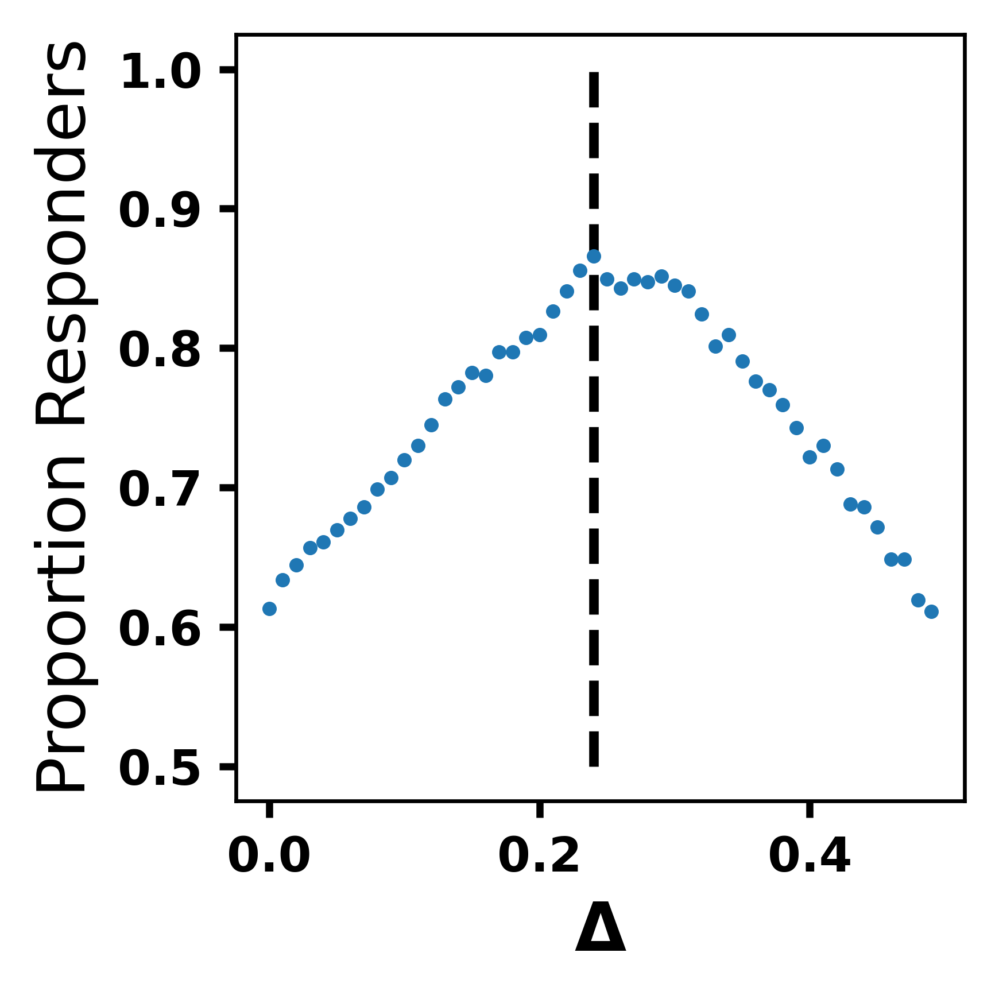

In [26]:
matplotlib.rcParams.update({'font.size': 10})
matplotlib.rcParams.update({'axes.labelsize' : 14})
matplotlib.rcParams.update({'axes.titlesize' : 8})
matplotlib.rcParams.update({'lines.markersize' : 2})

responsepercent = [i[0][:50] for i in output]
responsepercent = np.take(responsepercent,nofails,axis = 0)

plt.figure(figsize = (3,3), dpi = 600)
plt.plot(therapy[:50], np.sum(responsepercent, axis = 0)/df_nofails.shape[0], 'o')
plt.vlines(therapy[np.argmax(np.sum(responsepercent, axis = 0)/df_nofails.shape[0])],0.5,1, colors = 'k', linestyles = 'dashed')
plt.gca().set(xlabel = '$\Delta$', ylabel = 'Proportion Responders')
plt.tight_layout()
plt.savefig("Figures/normaldifftherapy.pdf")

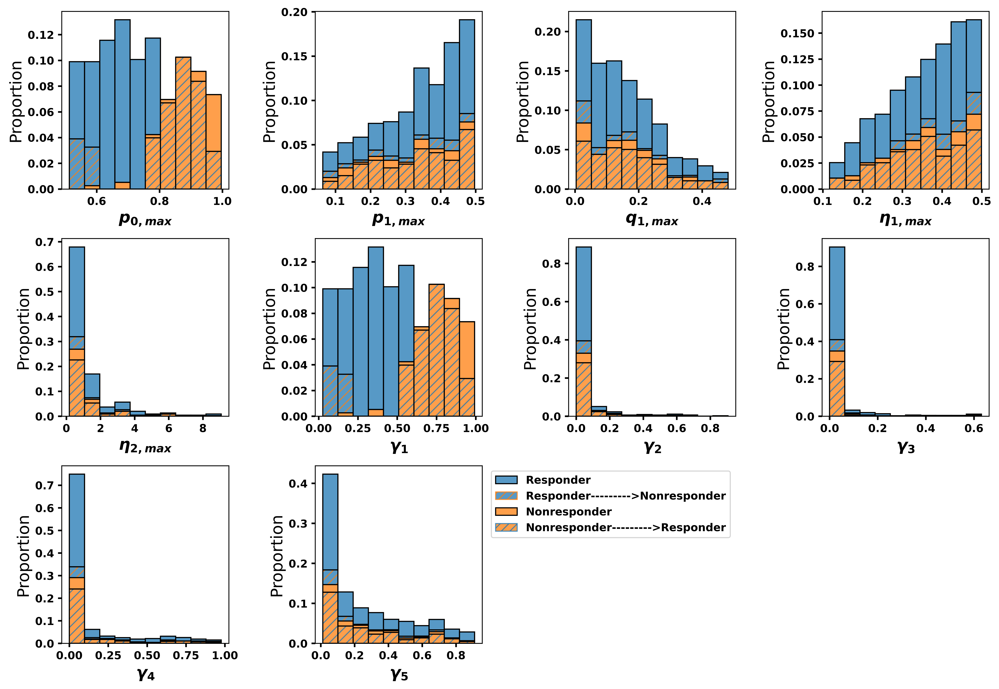

In [27]:
matplotlib.rcParams.update({'font.size': 10})
matplotlib.rcParams.update({'axes.labelsize' : 15})
matplotlib.rcParams.update({'axes.titlesize' : 8})
matplotlib.rcParams.update({'lines.markersize' : 2})

comboresult = [-1 if output[i][0][0]==output[i][0][24] & output[i][0][24] == 1 else 1 if output[i][0][0]==output[i][0][24] & output[i][0][24] == 0 else 2*(output[i][0][24]-output[i][0][0]) for i in range(df_temp.shape[0])]
comboresult = np.take(comboresult,nofails,axis = 0)
responders = [i for i in range(df_nofails.shape[0]) if comboresult[i] == 1]
nonresponders = [i for i in range(df_nofails.shape[0]) if comboresult[i] == 0]
unresponders = [i for i in range(df_nofails.shape[0]) if comboresult[i] == -1]

df_responders = df_nofails.iloc[responders,:-2].reset_index()
df_nonresponders = df_nofails.iloc[nonresponders,:-2].reset_index()
df_unresponders = df_nofails.iloc[unresponders,:-2].reset_index()

df_combo = df_nofails.iloc[:,:-2].reset_index()
df_combo['Combo'] = ['Unresponder' if i == -2 else 'Unchanged Responder' if i == -1 else 'Unchanged Nonresponder' if i == 1 else 'New Responder' for i in comboresult]

responders = [i for i in range(df_nofails.shape[0]) if output[i][0][24] == 1]
nonresponders = [i for i in range(df_nofails.shape[0]) if i not in responders]

df_responders = df_nofails.iloc[responders,0].reset_index()
df_nonresponders = df_nofails.iloc[nonresponders,:-2].reset_index()

hists = []
hatches = ['///','','///','']
faces = [(1.0, 0.4980392156862745, 0.054901960784313725, 0.75),(1.0, 0.4980392156862745, 0.054901960784313725, 0.75),(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75),(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75)]
edges = [(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75), 'k', (1.0, 0.4980392156862745, 0.054901960784313725, 0.75), 'k']

f,axes = plt.subplots(ncols=4, nrows = 3, figsize=(13,9), dpi = 600)
axes = axes.reshape(-1)

bins = [np.histogram_bin_edges(df_nonresponders.drop(['index'],axis = 1).iloc[:,i], bins=10) for i in range(df_combo.drop(['index', 'Combo'],axis = 1).shape[1])]
for i in range(df_combo.drop(['index', 'Combo'],axis = 1).shape[1]):
    f.sca(axes[i])
    hists.append(sns.histplot(data = df_combo.drop(['index'],axis = 1), x = df_combo.drop(['index'],axis = 1).columns[i], bins = bins[i], hue = 'Combo', fill = True, legend = False, multiple = 'stack', hue_order = ['Unchanged Responder','Unresponder','Unchanged Nonresponder','New Responder'], stat = 'proportion'))
    
for i in hists:
    for j,k in enumerate(i.patches):
        k.set_hatch(hatches[j//10])
        k.set_fc(faces[j//10])
        k.set_edgecolor(edges[j//10])

hists = []
for i in range(df_combo.drop(['index', 'Combo'],axis = 1).shape[1]):
    f.sca(axes[i])
    hists.append(sns.histplot(data = df_combo.drop(['index'],axis = 1), x = df_combo.drop(['index'],axis = 1).columns[i], bins = bins[i], hue = 'Combo', fill = True, legend = False, multiple = 'stack', hue_order = ['Unchanged Responder','Unresponder','Unchanged Nonresponder','New Responder'], stat = 'proportion'))
    
for i in hists:
    for j,k in enumerate(i.patches):
        if j < 40:
            continue
        k.set_fc((1,1,1,0))

legend_elements = [Patch(facecolor=(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75), edgecolor='k',
                         label='Responder'),
                  Patch(facecolor=(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75), edgecolor=(1.0, 0.4980392156862745, 0.054901960784313725, 0.75),
                         label='Responder--------->Nonresponder', hatch = '///'),
                  Patch(facecolor=(1.0, 0.4980392156862745, 0.054901960784313725, 0.75), edgecolor='k',
                         label='Nonresponder'),
                  Patch(facecolor=(1.0, 0.4980392156862745, 0.054901960784313725, 0.75), edgecolor=(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75),
                         label='Nonresponder--------->Responder', hatch = '///')]
lgd = axes[10].legend(handles=legend_elements)  
axes[10].set_axis_off()
axes[11].set_axis_off()
f.tight_layout()
f.savefig("Figures/7Bsupp.pdf")

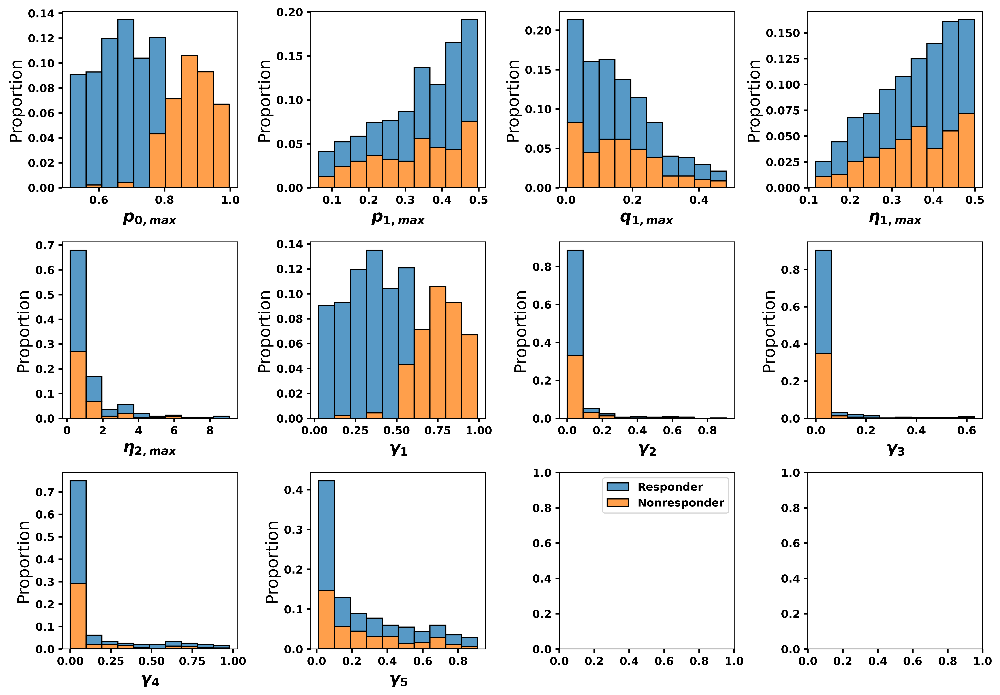

In [28]:
matplotlib.rcParams.update({'font.size': 10})
matplotlib.rcParams.update({'axes.labelsize' : 15})
matplotlib.rcParams.update({'axes.titlesize' : 8})
matplotlib.rcParams.update({'lines.markersize' : 2})


df_response = df_temp.iloc[:,:-2].reset_index()
comboresult = [1 if output[i][0][0] == 1 else 0 for i in range(df_temp.shape[0])]
df_response['Response'] = ['Responder' if i == 1 else 'Nonresponder' for i in comboresult]
responders = [i for i in nofails if comboresult[i] == 1]
nonresponders = [i for i in nofails if comboresult[i] == 0]

df_responders = df_temp.iloc[responders,:-2].reset_index()
df_nonresponders = df_temp.iloc[nonresponders,:-2].reset_index()

df_response = df_response.iloc[nofails]

f,axes = plt.subplots(ncols=4, nrows = 3, figsize=(13,9), dpi = 600)
axes = axes.reshape(-1)

for i in range(df_combo.drop(['index', 'Combo'],axis = 1).shape[1]):
    f.sca(axes[i])
    sns.histplot(data = df_response.drop(['index'],axis = 1), x = df_response.drop(['index'],axis = 1).columns[i], bins = bins[i], hue = 'Response', fill = True, legend = False, multiple = 'stack', hue_order = ['Responder','Nonresponder'], stat = 'proportion')

legend_elements = [Patch(facecolor=(0.12156862745098039, 0.4666666666666667, 0.7058823529411765, 0.75), edgecolor='k',
                         label='Responder'),
                  Patch(facecolor=(1.0, 0.4980392156862745, 0.054901960784313725, 0.75), edgecolor='k',
                         label='Nonresponder')]
lgd = axes[10].legend(handles=legend_elements)  


f.tight_layout()


f.savefig("Figures/6Bsupp.pdf")

<>:51: DeprecationWarning: invalid escape sequence \D
<>:58: DeprecationWarning: invalid escape sequence \e


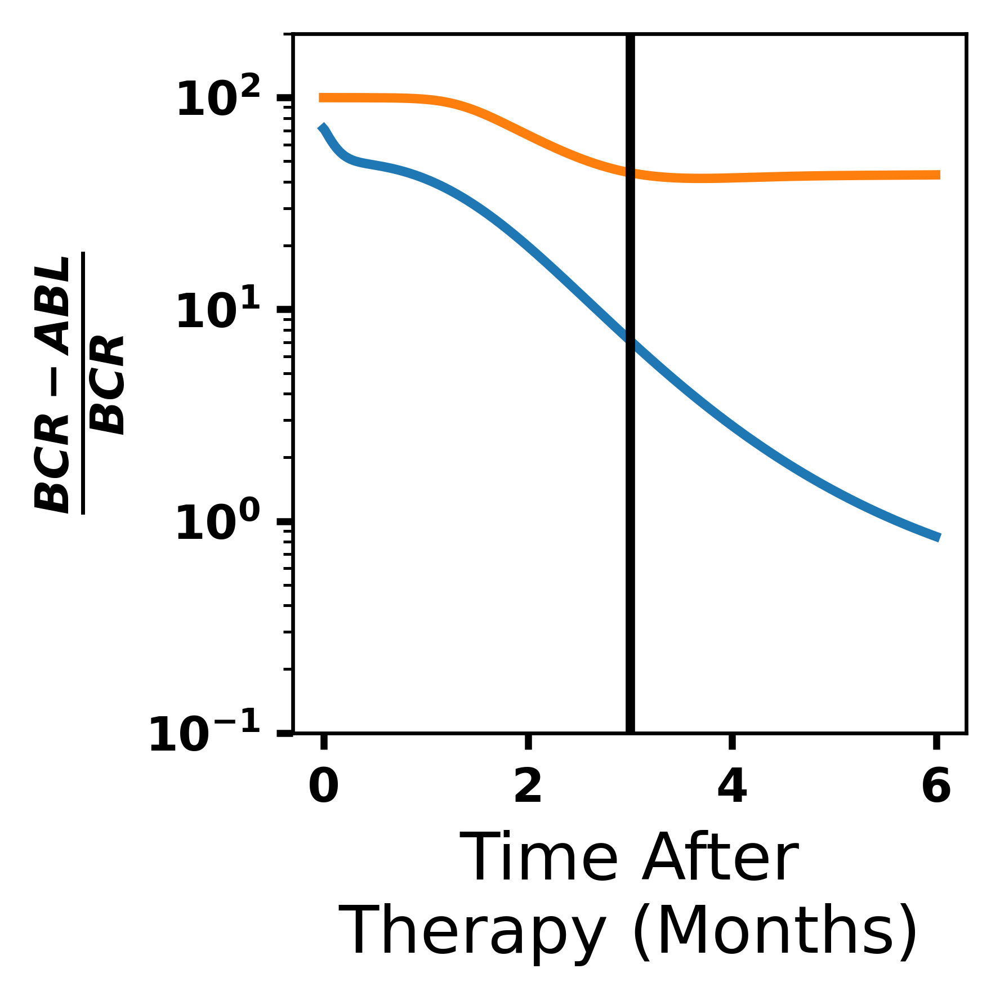

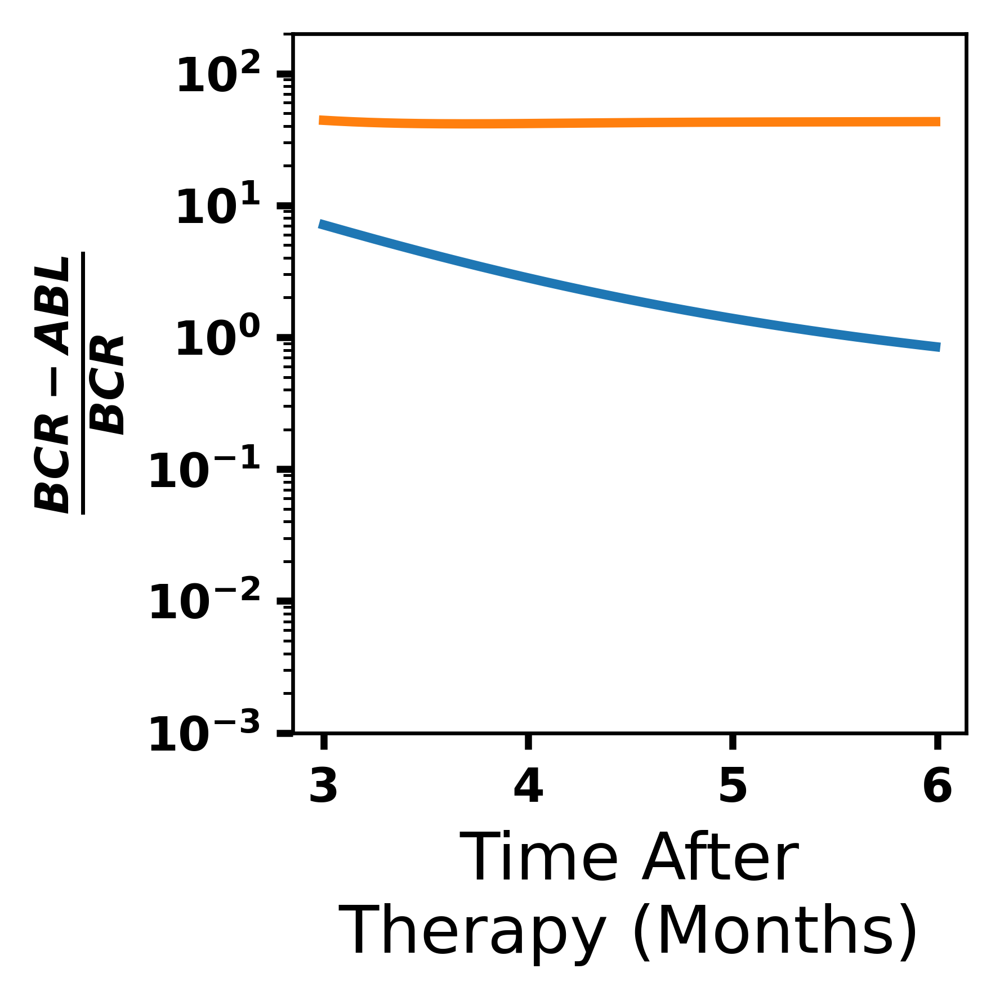

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


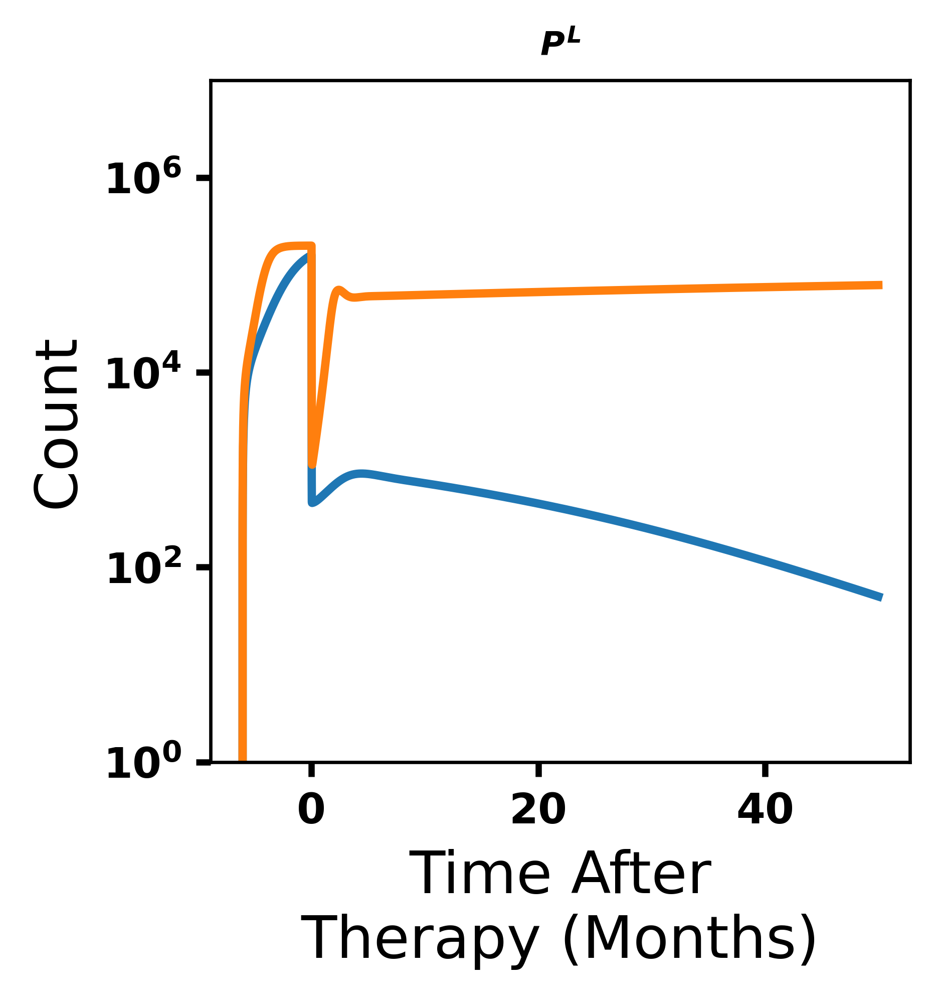

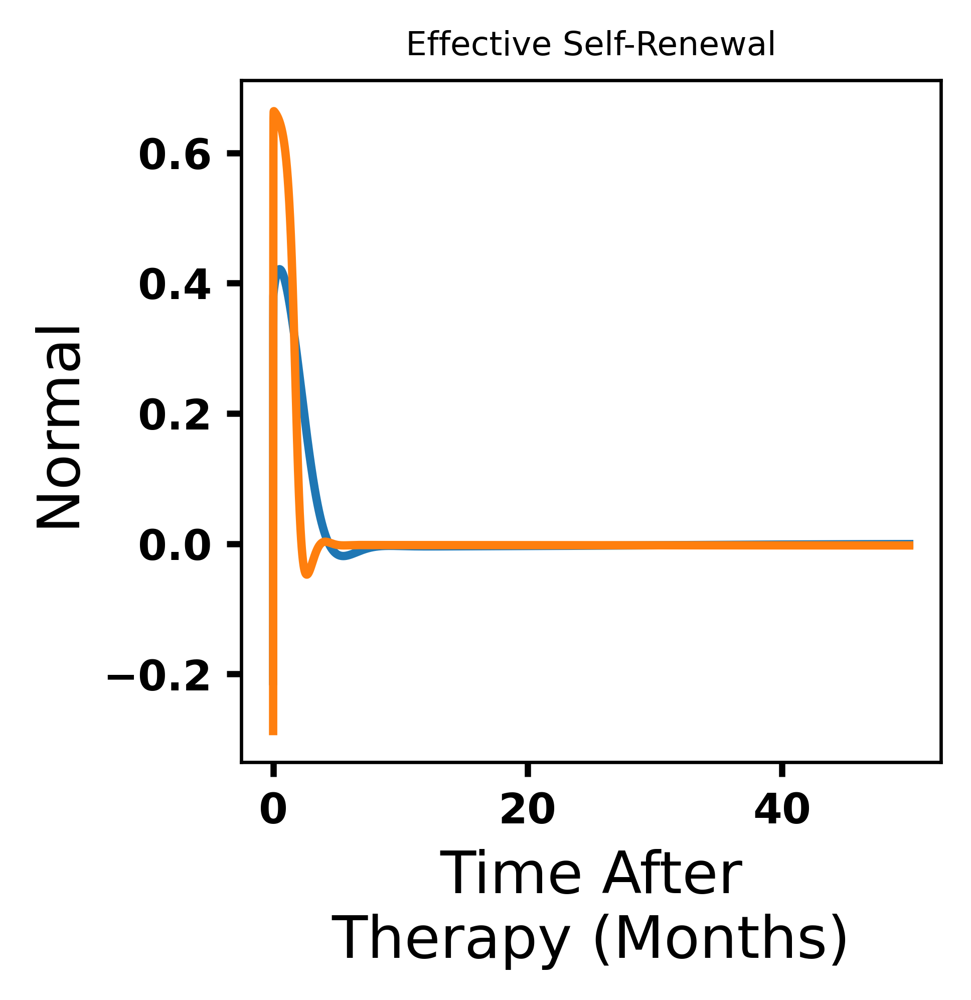

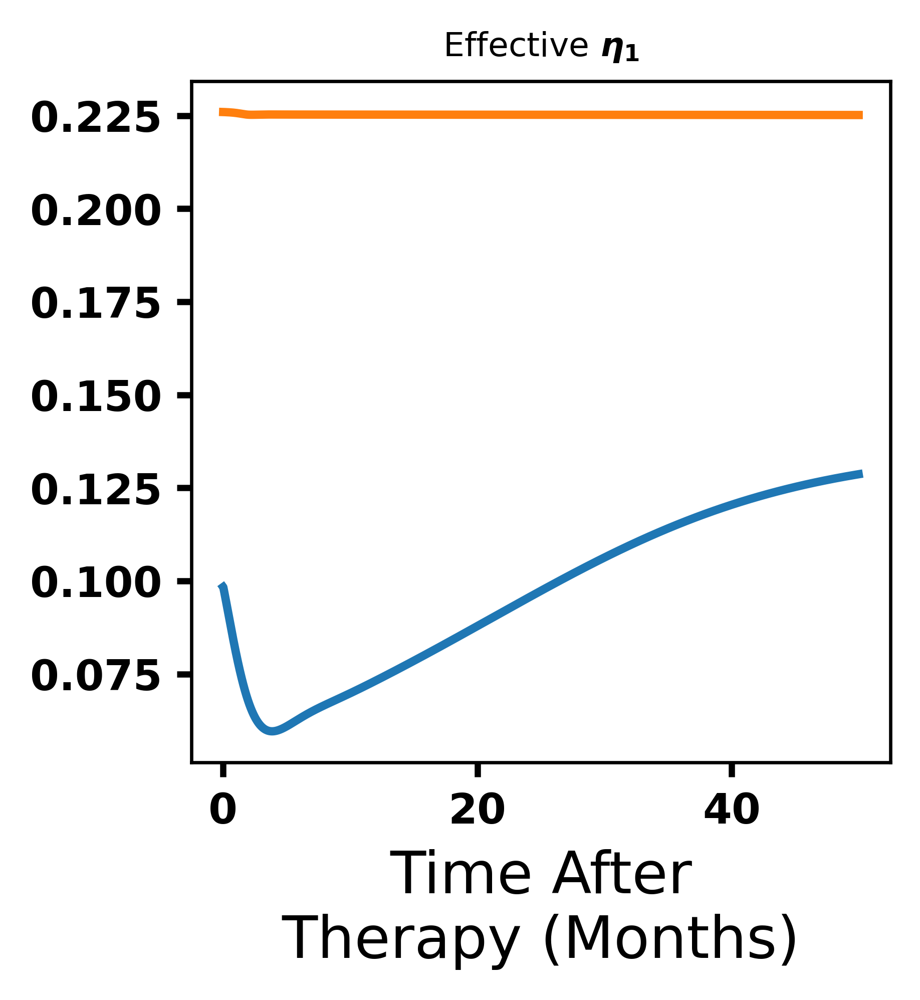

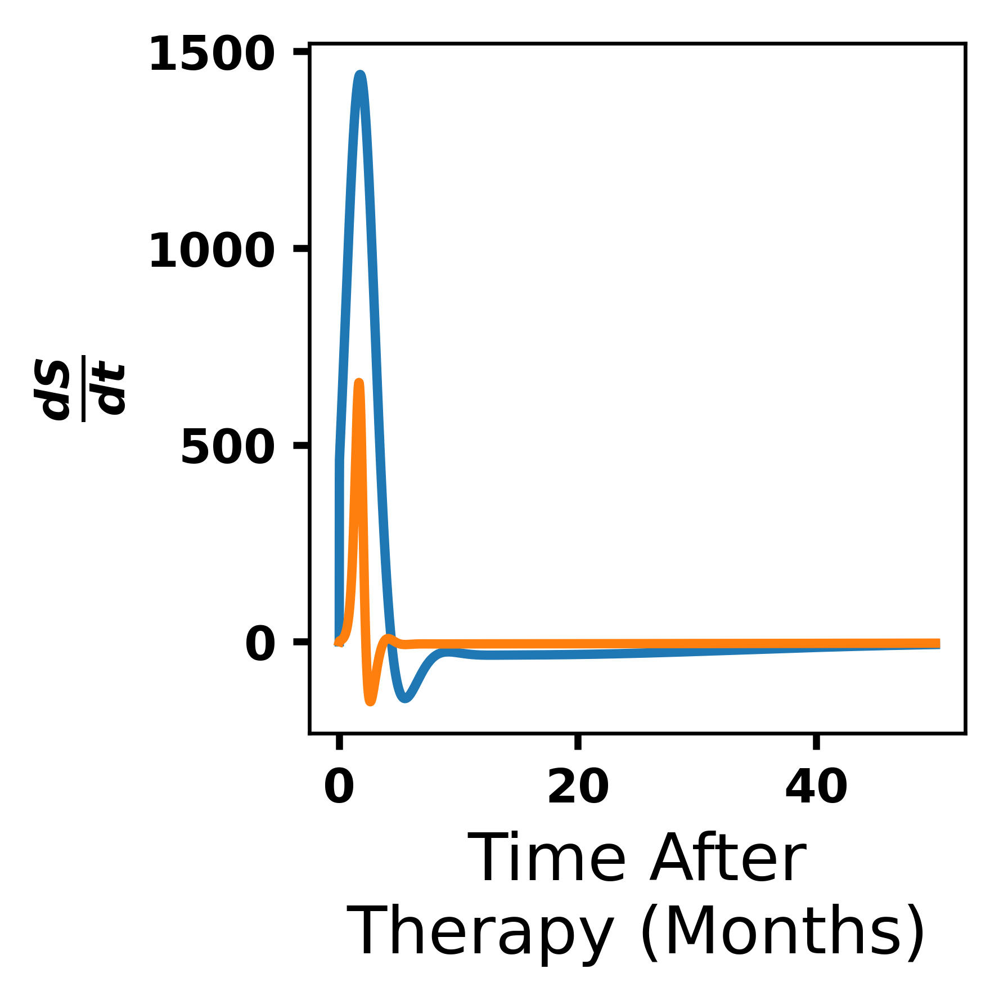

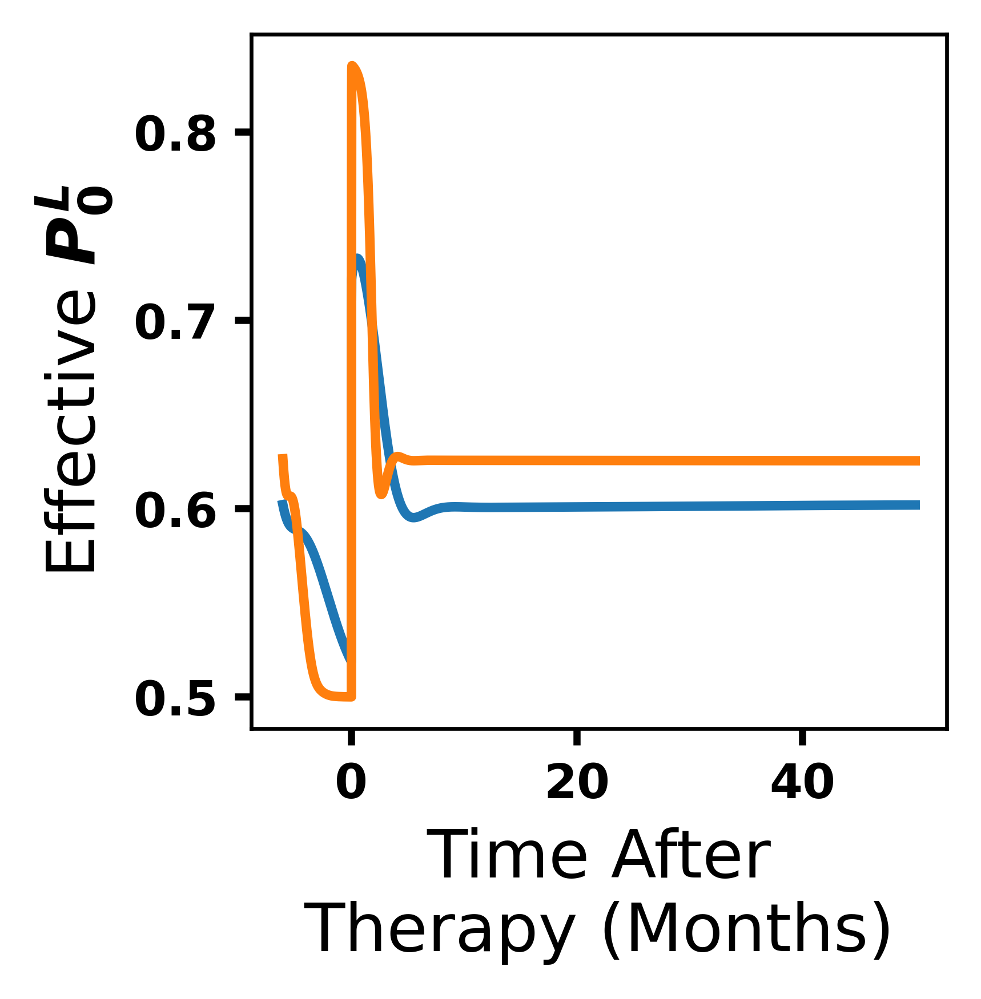

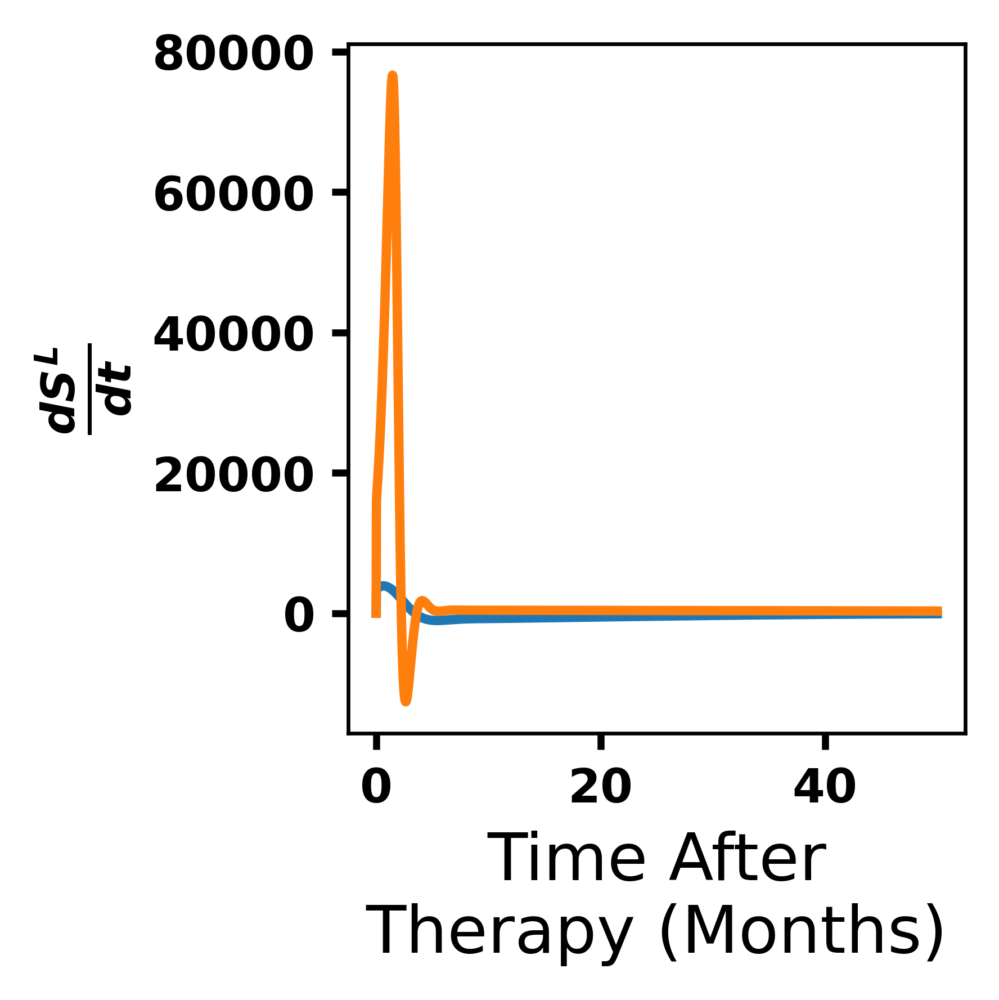

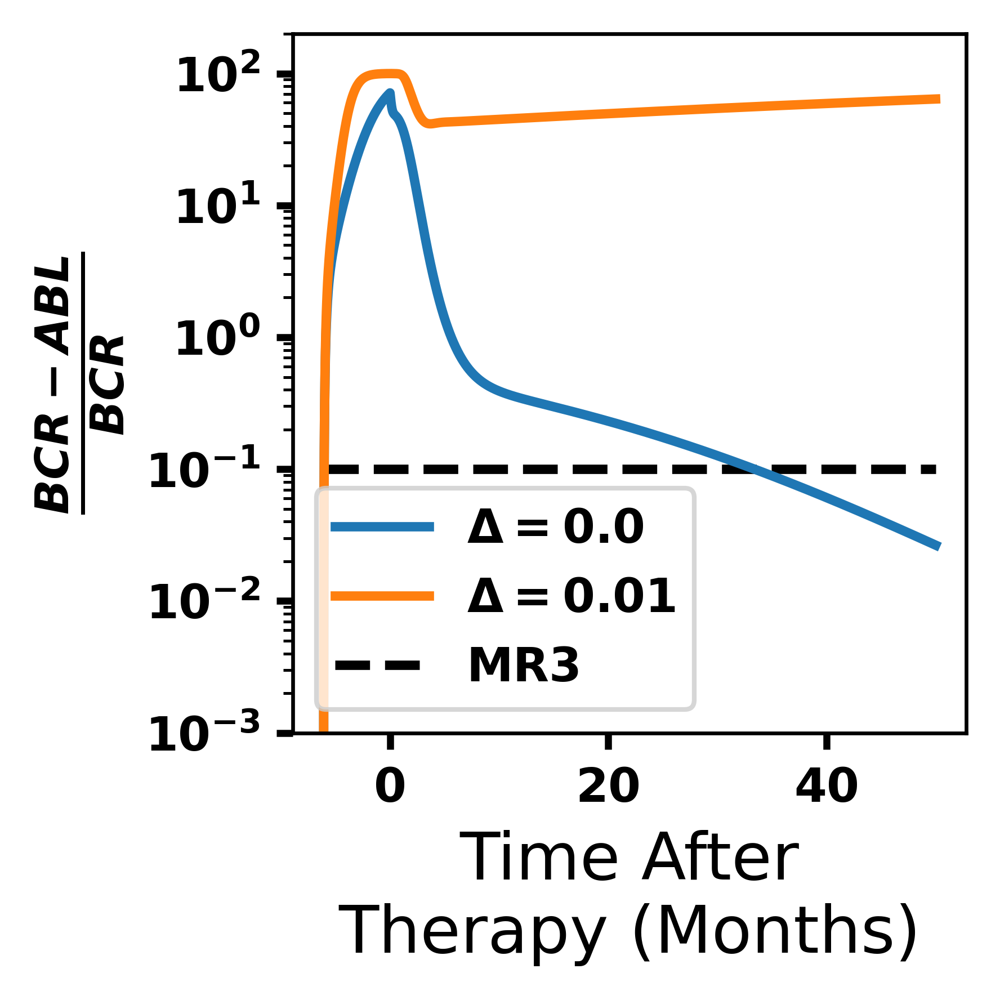

In [29]:
matplotlib.rcParams.update({'font.size': 8})
matplotlib.rcParams.update({'axes.labelsize' : 14})
matplotlib.rcParams.update({'axes.titlesize' : 8})
matplotlib.rcParams.update({'lines.markersize' : 2})

t1 = np.linspace(0,365*.5,1000)
t2 = np.linspace(0,1500,5000)
t = np.append(t1,t1[-1]+t2)

c = ['C0', 'C1']
celllabels = ['$S$', '$P$', '$TD_l$', '$TD_m$', '$S^L$', '$P^L$', '$TD_l^L$', '$TD_m^L$']
effectivelabels = ['Effective $p_0$', 'Effective Self-Renewal', 'Effective $\\eta_1$', '$\\frac{dS}{dt}$']
types = ['Normal', 'Leukemic']

param = [8,53]

f,axes = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f2,axes2 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f3,axes3 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f4,axes4 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f5,axes5 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f6,axes6 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f7,axes7 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f8,axes8 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)
f9,axes9 = plt.subplots(ncols=1, nrows=1, figsize=(3,3), dpi = 600)

for i in range(2):
    
    
    sim = output[param[i]][1][0].T
    axes.semilogy((t[999:1600]-365*.5)/30,100*(sim[6,999:1600]+sim[7,999:1600])/(2*(sim[2,999:1600]+sim[3,999:1600])+(sim[6,999:1600]+sim[7,999:1600])), color = c[i], zorder = 1)
    axes2.semilogy((t[1300:1600]-365*.5)/30,100*(sim[6,1300:1600]+sim[7,1300:1600])/(2*(sim[2,1300:1600]+sim[3,1300:1600])+(sim[6,1300:1600]+sim[7,1300:1600])), color = c[i])
    axes3.semilogy((t-365*.5)/30,1e5*sim[5], color = c[i])

    ep0 = df_temp.iloc[param[i],0].copy()/(1+df_temp.iloc[param[i],5].copy()*(sim[1]+sim[5]))
    ep0[:1000] = df_temp.iloc[param[i],0].copy()/(1+df_temp.iloc[param[i],5].copy()*(sim[1][:1000]+sim[5][:1000]))
    ee1 = df_temp.iloc[param[i],3].copy()/(1+df_temp.iloc[param[i],6].copy()*(sim[0]+sim[4]))
    dsdt = [(2*ep0[i]-1)*ee1[i]*1e5*sim[0][i] for i in range(6000)]
    dsdt[999:1001] = [0,0]
    axes4.plot((t[999:]-365*.5)/30, 2*ep0[999:]-1, color = c[i])
    axes5.plot((t[999:]-365*.5)/30, ee1[999:], color = c[i])
    axes6.plot((t[999:]-365*.5)/30, dsdt[999:], color = c[i])

    ep0L = df_temp.iloc[param[i],0].copy()/(1+.5*df_temp.iloc[param[i],5].copy()*(sim[1]+sim[5]))
    ee1L = df_temp.iloc[param[i],3].copy()/(1+df_temp.iloc[param[i],6].copy()*(sim[0]+sim[4]))
    dsLdt = [(2*ep0L[i]-1.25)*ee1L[i]*1e5*sim[4][i] for i in range(6000)]
    dsLdt[999:1001] = [0,0]
    axes7.plot((t-365*.5)/30, ep0L, color = c[i])
    axes8.plot((t[999:]-365*.5)/30, dsLdt[999:], color = c[i])

    axes9.semilogy((t-365*.5)/30, 100*(sim[6]+sim[7])/(2*(sim[2]+sim[3])+(sim[6]+sim[7])), color = c[i], label = '$\Delta={}$'.format(i/100))

        
axes.set(ylim = [1e-1,2e2], ylabel = '$\\frac{BCR-ABL}{BCR}$', xlabel = 'Time After\nTherapy (Months)')
axes2.set(ylim = [1e-3,2e2], ylabel = '$\\frac{BCR-ABL}{BCR}$', xlabel = 'Time After\nTherapy (Months)', xticks = [3,4,5,6])
axes3.set(title = celllabels[5], ylim = [1,1e7], ylabel = 'Count', xlabel = 'Time After\nTherapy (Months)')
axes4.set(title = 'Effective Self-Renewal', ylabel = 'Normal', xlabel = 'Time After\nTherapy (Months)')
axes5.set(title = 'Effective $\eta_1$', xlabel = 'Time After\nTherapy (Months)')
axes6.set(ylabel = '$\\frac{dS}{dt}$', xlabel = 'Time After\nTherapy (Months)')
axes7.set(title = '', ylabel = 'Effective $P_0^L$', xlabel = 'Time After\nTherapy (Months)')
axes8.set(ylabel = '$\\frac{dS^L}{dt}$', xlabel = 'Time After\nTherapy (Months)')
        
    
axes9.set(ylabel = '$\\frac{BCR-ABL}{BCR}$', xlabel = 'Time After\nTherapy (Months)', ylim = [1e-3,2e2])
axes9.hlines([1e-1],(t[0]-365*.5)/30,(t[-1]-365*.5)/30, linestyle = 'dashed', color = 'k', label = 'MR3')
axes9.legend()
    
f9.tight_layout()

f6.tight_layout()

f8.tight_layout()


axes.vlines([3],2e2,1e-3, 'k', zorder = 2)

f.tight_layout()
f.savefig('Figures/6D.pdf')
f2.tight_layout()
f2.savefig('Figures/6E.pdf')
f7.tight_layout()
f7.savefig('Figures/6C.pdf')


## Prognostic

3 0.23076923076923073 0.9177489177489178 -2.0092330025650473
25 0.0580357142857143 0.7402597402597403 25.0
5 0.09311740890688258 0.9090909090909091 -3.1992671377973836
41 0.10869565217391308 0.8831168831168831 41.0


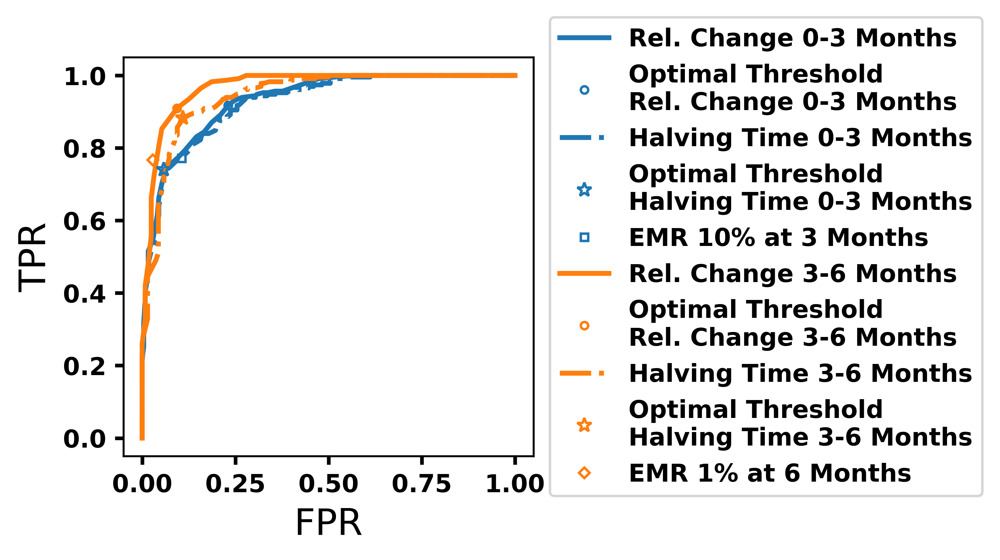

In [30]:
matplotlib.rcParams.update({'font.size': 10})
matplotlib.rcParams.update({'axes.labelsize' : 15})
matplotlib.rcParams.update({'axes.titlesize' : 15})
matplotlib.rcParams.update({'lines.markersize' : 3})

plt.figure(figsize = (3,3), dpi = 600)
lines = ['-','--','-.',':', '-']
types = ['Rel. Change', 'Ratio', 'Halving Time', 'Rel. Change Cell Count', 'Rel. Change Cell Counts']
dots = ['bo','go','ko']

xsmooth = np.linspace(0,1,100, endpoint = True)
time = list(zip(range(0,4,3),range(3,7,3)))
comphalv = np.zeros((5,len(time)))
thresholds = [np.concatenate((-np.logspace(0,10,100),np.linspace(-1,1,20),np.logspace(0,10,100))),np.concatenate((np.linspace(0,1,101),np.logspace(1,10,91))),np.concatenate((np.linspace(0,10000,10001),np.logspace(4,20,17))), np.concatenate((np.linspace(-10,10,201),-np.logspace(1,5,100))), np.concatenate((np.linspace(-10,10,201),-np.logspace(1,5,100)))]
bcrs = np.array([100*(output[i][1][0].T[6][1000:]+output[i][1][0].T[7][1000:])/(2*(output[i][1][0].T[2][1000:]+output[i][1][0].T[3][1000:])+(output[i][1][0].T[6][1000:]+output[i][1][0].T[7][1000:])) for i in range(df_temp.shape[0])])
for rounds in range(len(time)):
    time1 = time[rounds][0]
    time2 = time[rounds][1]
    progs = np.array([[(bcrs[i][int(600*time2/6)]-bcrs[i][int(600*time1/6)])/bcrs[i][int(600*time2/6)] for i in range(df_temp.shape[0])],
                    [bcrs[i][int(600*time2/6)]/bcrs[i][int(600*time1/6)] for i in range(df_temp.shape[0])],
                    [np.log(2)/-((np.log(bcrs[i][int(600*time2/6)])-np.log(bcrs[i][int(600*time1/6)]))/90) for i in range(df_temp.shape[0])],
                      [(((output[i][1][0].T[6][1000+int(600*time2/6)]-output[i][1][0].T[6][1000+int(600*time1/6)])/output[i][1][0].T[6][1000+int(600*time2/6)])+((output[i][1][0].T[7][1000+int(600*time2/6)]-output[i][1][0].T[7][1000+int(600*time1/6)])/output[i][1][0].T[7][1000+int(600*time2/6)]))/2 for i in range(df_temp.shape[0])],
                     [(output[i][1][0].T[7][1000+int(600*time2/6)]-output[i][1][0].T[7][1000+int(600*time1/6)])/output[i][1][0].T[7][1000+int(600*time2/6)] for i in range(df_temp.shape[0])]])
    for progtype in [0,2]:
        sense = []
        spec = []
        for j in thresholds[progtype]:
            P = 0
            N = 0
            TP = 0
            TN = 0
            FP = 0
            FN = 0
            for i in nofails:
                if progtype != 2 or progs[2][i] > 0:
                    if bcrs[i][1800] > 1e-1:
                        N += 1
                        if progs[progtype][i] > j:
                            TN += 1
                    else:
                        P += 1
                        if progs[progtype][i] < j:
                            TP += 1

            sense.append(TP/P)
            spec.append(1-TN/N)
        specsense = np.array([spec,sense]).T
        ind = np.lexsort((specsense[:,1],specsense[:,0]))    
        specsense = specsense[ind].T
        
        bestind = np.argmax(np.subtract(sense,spec))
        print(bestind, spec[bestind], sense[bestind], thresholds[progtype][bestind])
        comphalv[progtype,rounds] = thresholds[progtype][bestind]
        
        plt.plot(specsense[0], specsense[1], linestyle = lines[progtype], label = types[progtype]+' {}-{} Months'.format(time1,time2), color = 'C{}'.format(rounds), zorder = 1)
        if progtype == 2:
            plt.plot(spec[bestind],sense[bestind], '*', zorder = 2, markerfacecolor = 'None', alpha = 1, color = 'C{}'.format(rounds), label = 'Optimal Threshold\nHalving Time {}-{} Months'.format(time1,time2), markersize = 6)
        else:
            plt.plot(spec[bestind],sense[bestind], 'o', zorder = 2, markerfacecolor = 'None', alpha = 1, color = 'C{}'.format(rounds), label = 'Optimal Threshold\nRel. Change {}-{} Months'.format(time1,time2))
plt.plot(0.10569105691056913, 0.771551724137931, 's', color = 'C0', markerfacecolor = 'none', label = 'EMR 10% at 3 Months')
plt.plot(0.028455284552845517, 0.7672413793103449, 'D', color = 'C1', markerfacecolor = 'none', label = 'EMR 1% at 6 Months')
handles, labels = plt.gca().get_legend_handles_labels()
order = [0,1,2,3,8,4,5,6,7,9]
lgd = plt.legend(handles = [handles[i] for i in order], labels = [labels[i] for i in order], bbox_to_anchor=(1.04,0.5), loc="center left", borderaxespad=0)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.savefig("Figures/prognostic.pdf", bbox_extra_artists=(lgd,), bbox_inches='tight')

3 0.23076923076923073 0.9177489177489178 -2.0092330025650473
25 0.0580357142857143 0.7402597402597403 25.0
5 0.09311740890688258 0.9090909090909091 -3.1992671377973836
41 0.10869565217391308 0.8831168831168831 41.0


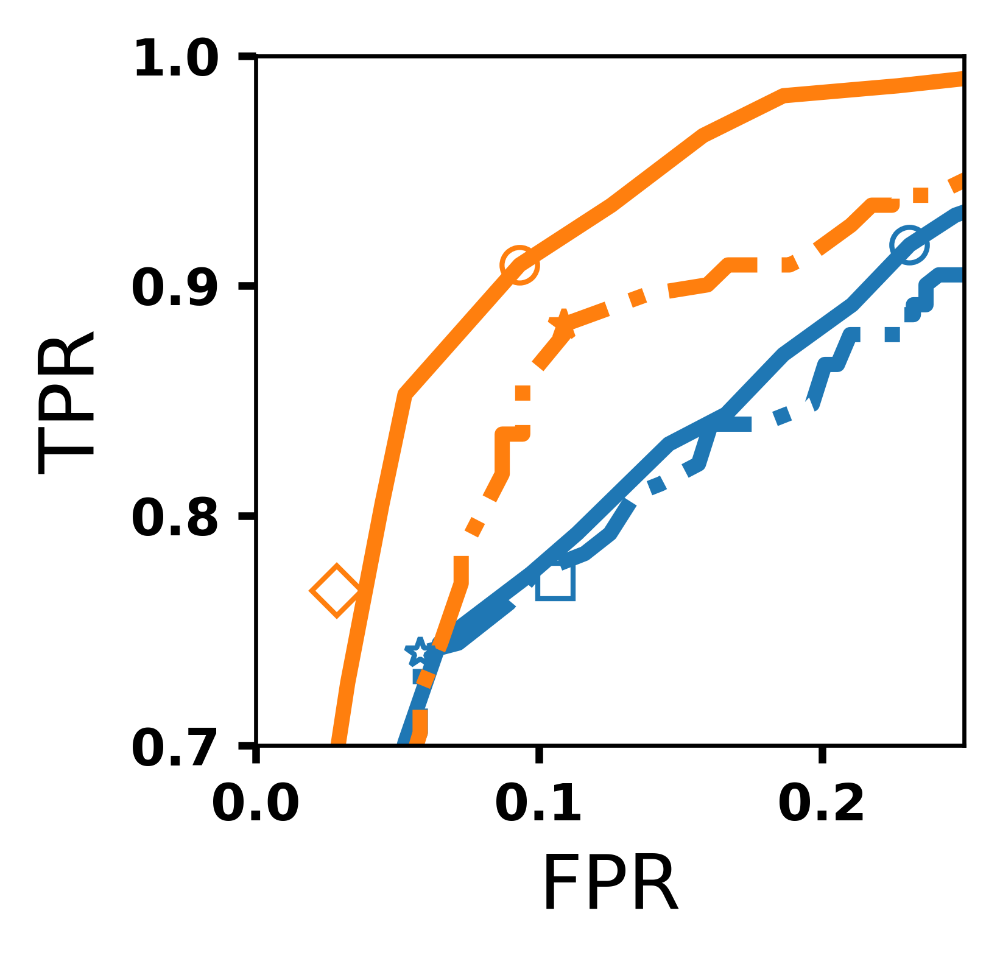

In [31]:
matplotlib.rcParams.update({'font.size': 10})
matplotlib.rcParams.update({'axes.labelsize' : 15})
matplotlib.rcParams.update({'axes.titlesize' : 15})
matplotlib.rcParams.update({'lines.markersize' : 7})

f = plt.figure(figsize = (2.5,2.5), dpi = 600)
lines = ['-','--','-.',':', '-']
types = ['Rel. Change', 'Ratio', 'Halving Time', 'Rel. Change Cell Count', 'Rel. Change Cell Counts']
dots = ['bo','go','ko']

xsmooth = np.linspace(0,1,100, endpoint = True)
time = list(zip(range(0,4,3),range(3,7,3)))
comphalv = np.zeros((5,len(time)))
thresholds = [np.concatenate((-np.logspace(0,10,100),np.linspace(-1,1,20),np.logspace(0,10,100))),np.concatenate((np.linspace(0,1,101),np.logspace(1,10,91))),np.concatenate((np.linspace(0,10000,10001),np.logspace(4,20,17))), np.concatenate((np.linspace(-10,10,201),-np.logspace(1,5,100))), np.concatenate((np.linspace(-10,10,201),-np.logspace(1,5,100)))]
bcrs = np.array([100*(output[i][1][0].T[6][1000:]+output[i][1][0].T[7][1000:])/(2*(output[i][1][0].T[2][1000:]+output[i][1][0].T[3][1000:])+(output[i][1][0].T[6][1000:]+output[i][1][0].T[7][1000:])) for i in range(df_temp.shape[0])])
for rounds in range(len(time)):
    time1 = time[rounds][0]
    time2 = time[rounds][1]
    progs = np.array([[(bcrs[i][int(600*time2/6)]-bcrs[i][int(600*time1/6)])/bcrs[i][int(600*time2/6)] for i in range(df_temp.shape[0])],
                    [bcrs[i][int(600*time2/6)]/bcrs[i][int(600*time1/6)] for i in range(df_temp.shape[0])],
                    [np.log(2)/-((np.log(bcrs[i][int(600*time2/6)])-np.log(bcrs[i][int(600*time1/6)]))/90) for i in range(df_temp.shape[0])],
                      [(((output[i][1][0].T[6][1000+int(600*time2/6)]-output[i][1][0].T[6][1000+int(600*time1/6)])/output[i][1][0].T[6][1000+int(600*time2/6)])+((output[i][1][0].T[7][1000+int(600*time2/6)]-output[i][1][0].T[7][1000+int(600*time1/6)])/output[i][1][0].T[7][1000+int(600*time2/6)]))/2 for i in range(df_temp.shape[0])],
                     [(output[i][1][0].T[7][1000+int(600*time2/6)]-output[i][1][0].T[7][1000+int(600*time1/6)])/output[i][1][0].T[7][1000+int(600*time2/6)] for i in range(df_temp.shape[0])]])
    for progtype in [0,2]:
        sense = []
        spec = []
        for j in thresholds[progtype]:
            P = 0
            N = 0
            TP = 0
            TN = 0
            FP = 0
            FN = 0
            for i in nofails:
                if progtype != 2 or progs[2][i] > 0:
                    if bcrs[i][1800] > 1e-1:
                        N += 1
                        if progs[progtype][i] > j:
                            TN += 1
                    else:
                        P += 1
                        if progs[progtype][i] < j:
                            TP += 1

            sense.append(TP/P)
            spec.append(1-TN/N)
        specsense = np.array([spec,sense]).T
        ind = np.lexsort((specsense[:,1],specsense[:,0]))    
        specsense = specsense[ind].T
        
        bestind = np.argmax(np.subtract(sense,spec))
        print(bestind, spec[bestind], sense[bestind], thresholds[progtype][bestind])
        comphalv[progtype,rounds] = thresholds[progtype][bestind]
        
        plt.plot(specsense[0], specsense[1], linestyle = lines[progtype], label = types[progtype]+' {}-{} Months'.format(time1,time2), color = 'C{}'.format(rounds), zorder = 1,linewidth=3)
        if progtype == 2:
            plt.plot(spec[bestind],sense[bestind], '*', zorder = 2, markerfacecolor = 'None', alpha = 1, color = 'C{}'.format(rounds), label = 'Optimal Threshold\nHalving Time {}-{} Months'.format(time1,time2), markersize = 6)
        else:
            plt.plot(spec[bestind],sense[bestind], 'o', zorder = 2, markerfacecolor = 'None', alpha = 1, color = 'C{}'.format(rounds), label = 'Optimal Threshold\nRel. Change {}-{} Months'.format(time1,time2))
plt.plot(0.10569105691056913, 0.771551724137931, 's', color = 'C0', markerfacecolor = 'none', label = 'EMR 10% at 3 Months')
plt.plot(0.028455284552845517, 0.7672413793103449, 'D', color = 'C1', markerfacecolor = 'none', label = 'EMR 1% at 6 Months')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.ylim([.7,1])
plt.xlim([0,.25])
f.savefig("Figures/prognosticinset.pdf", bbox_inches='tight')

## References

Manesso E, Teles J, Bryder D, Peterson C. [Dynamical modelling of haematopoiesis: an integrated view over the system in homeostasis and under perturbation.](https://www.ncbi.nlm.nih.gov/pubmed/23256190) J R Soc Interface. 2013;10(80):20120817.

Reynaud D, Pietras E, Barry-Holson K, Mir A, Binnewies M, Jeanne M, et al. [IL-6 controls leukemic multipotent progenitor cell fate and contributes to chronic myelogenous leukemia development.](https://www.ncbi.nlm.nih.gov/pubmed/22094259) Cancer Cell. 2011;20(5):661-73.

Pietras EM, Lakshminarasimhan R, Techner JM, Fong S, Flach J, Binnewies M, et al. [_Re-entry into quiescence protects hematopoietic stem cells from the killing effect of chronic exposure to type I interferons._](https://www.ncbi.nlm.nih.gov/pubmed/24493802) J Exp Med. 2014;211(2):245-62.